# J1816 - Stellar Variation Removal

In this notebook we will model the stellar pulsations of J1816 and then recombine all the data.

In [1]:
import emcee
import numpy as np
from tqdm import tqdm
from Code import mcmc
import matplotlib.pyplot as plt
from Code import ground_variation as gv
from Code import stellar_variation as sv
from astropy.convolution import convolve, Box1DKernel

%matplotlib inline

## Extracting Photometry

Data from the AAVSO is in magnitudes, but light curve analysis should be done in flux. The following is a function to extract the data.

In [2]:
def load_aavso(filename, flux=False):
    '''
    this function loads the aavso data
    
    Parameters
    ----------
    filename : str
        name of the file containing all the aavso data
    flux : bool
        if true return fluxes, instead of magnitudes
        
    Returns
    -------
    times : list - float
        list of lists containing the times for each of the observers + bands
    magnitudes : list - float
        list of lists containing the magnitudes for each of the observers + bands
    errors : list - float
        list of lists containing the errors for each of the observers + bands
    IDs : list - str
        list of the observers + bands
    '''
    all_times, all_mags, all_errors, all_airmasses = np.genfromtxt(filename, usecols=(0, 1, 2, 12), skip_header=1, 
                                                                delimiter=',', filling_values=0).T
    all_bands, all_obs = np.loadtxt(filename, usecols=(4,5), skiprows=1, delimiter=',', dtype=str).T 
    times = []
    magnitudes = []
    errors = []
    airmasses = []
    IDs = []
    # get unique observers
    observers = np.unique(all_obs)
    for observer in observers:
        obs_mask       = (all_obs == observer)
        obs_times      = all_times[obs_mask]
        obs_magnitudes = all_mags[obs_mask]
        obs_errors     = all_errors[obs_mask]
        obs_airmasses  = all_airmasses[obs_mask]
        obs_all_bands  = all_bands[obs_mask]
        obs_bands      = np.unique(obs_all_bands)
        for obs_band in obs_bands:
            band_mask       = (obs_all_bands == obs_band)
            band_times      = obs_times[band_mask]
            band_magnitudes = obs_magnitudes[band_mask]
            band_errors     = obs_errors[band_mask]
            band_airmasses  = obs_airmasses[band_mask]
            # appending
            times.append(band_times)
            magnitudes.append(band_magnitudes)
            errors.append(band_errors)
            airmasses.append(band_airmasses)
            IDs.append('%s %s' % (observer, obs_band))
    if flux == True:
        fluxes = []
        flux_errors = []
        for magnitude, error, ID in zip(magnitudes, errors, IDs):
            # determine flux
            flux = 10**(magnitude/-2.5)
            # determine the flux error for magnitude +- error
            flux_m = 10**((magnitude+error)/-2.5)
            flux_p = 10**((magnitude-error)/-2.5)
            error_m = np.abs(flux - flux_m)
            error_p = np.abs(flux_p - flux)
            # determine the maximum error
            flux_error = error_p
            flux_error[flux_error<error_m] = error_m[flux_error<error_m]
            # normalise both
            flux_error /= flux # gives you the error of the flux in relation to the flux, which is then normalised
            flux /= np.median(flux)
            flux_error /= np.median(flux)
            # append
            fluxes.append(flux)
            flux_errors.append(flux_error)
        return times, fluxes, flux_errors, airmasses, IDs
    else:
        return times, magnitudes, errors, airmasses, IDs

We are only interested in observers who submitted more than 10 observations (otherwise there is no "self reference")

In [3]:
time_aavso, flux_aavso, error_aavso, airmass_aavso, tel_aavso = load_aavso('data/aavso_j1816.txt', flux=True)
    
times      = []
fluxes     = []
errors     = []
airmasses  = []
telescopes = [] 

for time, flux, error, airmass, telescope in zip(time_aavso, flux_aavso, error_aavso, airmass_aavso, tel_aavso):
    if len(time) > 10:
        times.append(time)
        fluxes.append(flux)
        errors.append(error)
        airmasses.append(airmass)
        telescopes.append(telescope)
        print('%s performed %s observations' % (telescope.rjust(10), str(len(time)).rjust(4)))
        
print('%i valid contributors (12 people)' % len(times))

     DFS B performed   80 observations
     DFS R performed   79 observations
     DFS V performed   79 observations
    DGRA V performed 7588 observations
   DJUA CV performed  141 observations
     HMB B performed  170 observations
     HMB I performed  167 observations
     HMB V performed  170 observations
    KNAA B performed   35 observations
    KNAA I performed   35 observations
    KNAA R performed   35 observations
    KNAA V performed   35 observations
     MGW B performed   24 observations
     MGW I performed   23 observations
     MGW R performed   24 observations
     MGW V performed   24 observations
    MMEA B performed  249 observations
    MMEA R performed  244 observations
    MMEA V performed  245 observations
    OAAA B performed  136 observations
    OAAA R performed  156 observations
    OAAA V performed  150 observations
     SDB R performed  220 observations
    SREB I performed   90 observations
     TTG V performed  439 observations
     VMT B performed   88

Plot the data to see what it looks like

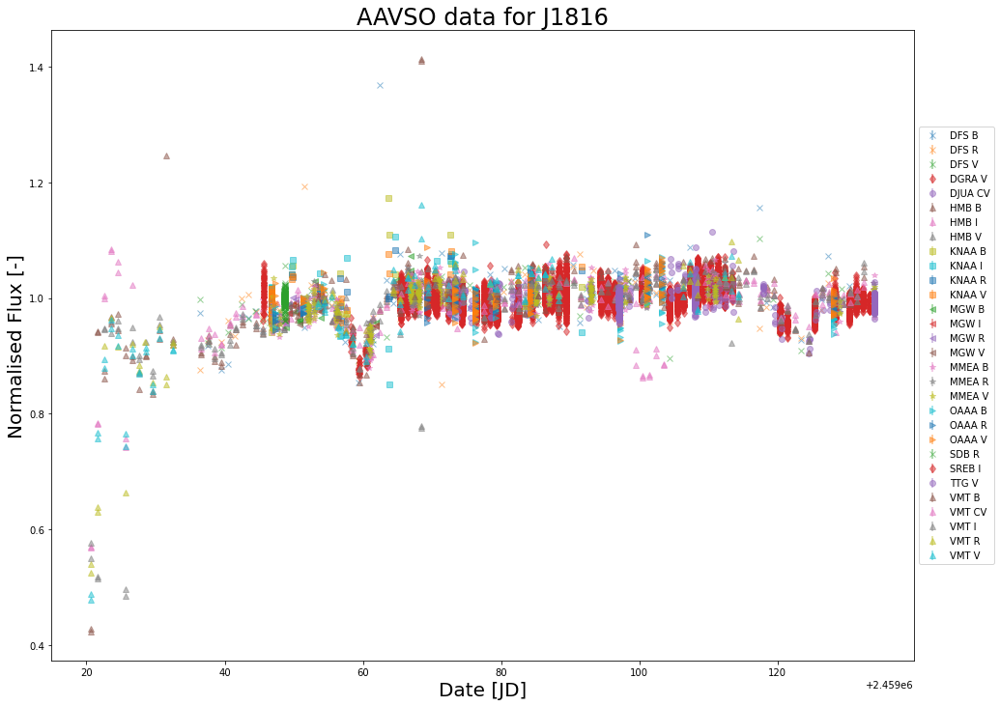

In [4]:
#          DFS     DGRA  DJUA    HMB   KNAA    MGW     MMEA     OAAA   SDB  SREB   TTG   VMT
symbols = 3*['x']+['d']+['o']+3*['^']+4*['s']+4*['<']+3*['*']+3*['>']+['x']+['d']+['o']+5*['^']
shifts = np.zeros(30)
alpha = 0.5

fig = plt.figure(figsize=(16,12))
for time, flux, error, telescope, symbol, shift in zip(times, fluxes, errors, telescopes, symbols, shifts):
    plt.errorbar(time, flux + shift, yerr=0*error, fmt=symbol, label='%s' % telescope, alpha=alpha)
plt.xlabel('Date [JD]', fontsize=20)
plt.ylabel('Normalised Flux [-]', fontsize=20)
plt.title('AAVSO data for J1816', fontsize=24)
plt.legend(loc='center left', bbox_to_anchor=[1.0, 0.5])
plt.show()
 

## Stellar Variations

We see that DGRA has lots of data of very high cadence. If we observe this data we can see stellar pulsations. We will use this data to construct a model and remove it from all the other data.

In [5]:
def get_data(times, mags, errors, tels, shifts, symbols, tel_ind, bin_size=1e-9, poly_deg=0, 
             fit=False, tlims=(0,1e10), tshift=False):
    '''
    this function extracts data for a telescope and all the relevant plot characteristics. it
    can bin the data and it fits a polynomial to each night
    
    Parameters
    ----------
    times : list of arrays
        contains the time data for each telescope
    mags : list of arrays
        contains the magnitude data for each telescope can also be fluxes
    errors : list of arrays
        contains the error data for each telescope
    tels : list of strs
        contains the name of each telescope (observer filter)
    shifts : list of floats
        contains the magnitude shift value for each telescope
    symbol : list of strs
        contains the markers for each telescope
    tel_ind : int
        which telescope you want to extract (also produces color)
    bin_size : float
        size of each bin (data is binned before nightly polynomial fitting)
    poly_deg : int
        degree of the polynomial to fit to each night
    fit : bool
        choose whether to fit a polynomial or not
    tlims : tuple
        limits of time to consider
    shift : boolean
        if true then limit is from 0.5 - 1.5 instead of 0.0 - 1.0
        
    Returns
    -------
    time : array of floats
        array of time data binned or not
    nmag : array of floats
        array of magnitude data binned or not (shifted and polynomial fitted)
    err : array of floats
        array of error data binned or not
    tel : str
        name of the telescope
    symb : str
        plot marker for the telescope
    clr : str
        plot color of the telescope
    pfits : list of arrays
        contains best fit parameters for polynomial fit
    '''
    pfits = []
    tls = []
    symb = symbols[tel_ind]
    clr  = 'C%i' % tel_ind
    tel  = tels[tel_ind]
    shft = shifts[tel_ind]
    # extract photometry
    time = times[tel_ind]
    mag  = mags[tel_ind]
    err  = errors[tel_ind]
    # apply tlim mask
    mask = (time > tlims[0]) * (time < tlims[1])
    time = time[mask]
    mag  = mag[mask]
    err  = err[mask]
    # bin
    time, mag, err = gv.bin_telescope(time, mag + shft, err, bin_size)
    # nightly polynomial fitting
    if fit == True:
        # new arrays
        nmag = np.zeros_like(mag)
        # loop to correct
        tmin = np.floor(np.amin(time))
        tmax = np.ceil(np.amax(time))
        # correction for australia / hawaii
        if tshift == True:
            tmin -= 0.5
            tmax += 0.5
        ind0 = 0
        # nightly polynomials
        points_per_night = []
        while tmin < tmax:
            mask = (time >= tmin) * (time <= tmin + 1)
            ind1 = int(np.sum(mask))
            points_per_night.append(ind1)
            if ind1 > 0:
                temp_time = time[mask]
                temp_mag  = mag[mask]
                temp_err  = err[mask]
                pfit = np.polyfit(temp_time, temp_mag, poly_deg, w=1/temp_err)
                if poly_deg==1 and np.abs(pfit[0]) > 0.1:
                    pfit = np.polyfit(temp_time, temp_mag, 0, w=1/temp_err)
                pfits.append(pfit)
                tls.append(tmin)
                temp_mag -= np.polyval(pfit, temp_time)
                nmag[ind0:ind0+ind1] = temp_mag
            ind0 = ind0+ind1
            tmin += 1
        if np.amax(points_per_night) < 3:
            pfit = np.polyfit(time, mag, poly_deg, w=1/err)
            pfits = [pfit]
            tls = [tls[0]]
            nmag = mag - np.polyval(pfit, time)
    else:
        nmag = mag
    return time, nmag, err, tel, symb, clr, pfits, tls


def get_multiple(times, mags, errors, tels, shifts, symbols, tel_inds, bin_size=1e-9, poly_deg=0, 
                 fit=False, tlims=(0, 1e10), tshifts='None'):
    '''
    this function extracts data for a telescope and all the relevant plot characteristics. it
    can bin the data and it fits a polynomial to each night
    
    Parameters
    ----------
    times : list of arrays
        contains the time data for each telescope
    mags : list of arrays
        contains the magnitude data for each telescope can also be fluxes
    errors : list of arrays
        contains the error data for each telescope
    tels : list of strs
        contains the name of each telescope (observer filter)
    shifts : list of floats
        contains the magnitude shift value for each telescope
    symbol : list of strs
        contains the markers for each telescope
    tel_inds : list of int
        which telescopes you want to extract (also produces color)
    bin_size : float
        size of each bin (data is binned before nightly polynomial fitting)
    poly_deg : int
        degree of the polynomial to fit to each night
    fit : bool
        choose whether to fit a polynomial or not
    tlims : tuple
        limits of time to consider
    tshifts : list of boolean
        if true then limit is from 0.5 - 1.5 instead of 0.0 - 1.0
        
    Returns
    -------
    mtimes : list of arrays
        array of time data binned or not
    mmags : list of arrays
       array of magnitude data binned or not (shifted and polynomial fitted)
    merrs : list of arrays
        array of error data binned or not
    mtels : list of str
        name of each telescope
    msymbs : list of str
        plot markers for each telescope
    mclrs : list of str
        plot colors for each telescope
    mpfits : list of arrays
        contains best fit parameters for polynomial fit
    mtls : list of arrays
        bottom t limit for each night fit
    '''
    mtimes = []
    mmags  = []
    merrs  = []
    mtels  = []
    msymbs = []
    mclrs  = []
    mpfits = []
    mtls   = []
    if tshifts == 'None':
        tshifts = np.zeros(len(tel_inds)).astype(np.bool)
    for tel_ind, tshift in zip(tel_inds, tshifts):
        print('extracting %s' % tels[tel_ind])
        mt, mm, me, mT, ms, mc, mp, ml = get_data(times, mags, errors, tels, shifts, symbols, tel_ind,
                                          bin_size, poly_deg, fit, tlims, tshift)
        mtimes.append(mt)
        mmags.append(mm)
        merrs.append(me)
        mtels.append(mT)
        msymbs.append(ms)
        mclrs.append(mc)
        mpfits.append(mp)
        mtls.append(ml)
    return mtimes, mmags, merrs, mtels, msymbs, mclrs, mpfits, mtls

### Extract High Cadence Data (DGRA)

We extract the DGRA V data, because of the high cadence and significant number of observations. We choose to bin the data by 0.001 days (86 seconds).

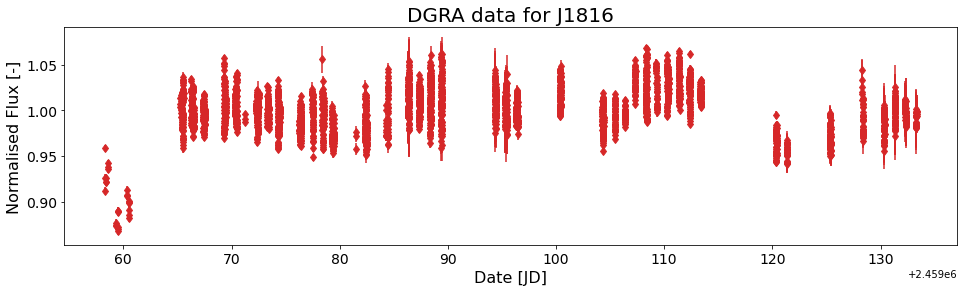

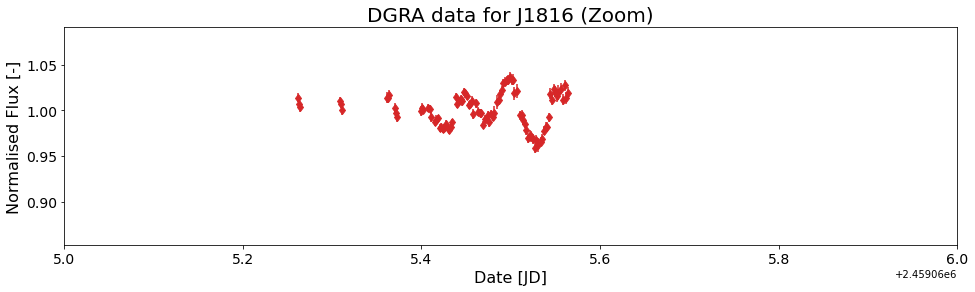

In [6]:
# chose a bin size
bs = 0.001
# extract the data
dgra = get_data(times, fluxes, errors, telescopes, shifts, symbols, 3, fit=False, bin_size=bs)
dgra_time, dgra_flux, dgra_error, dgra_tel, dgra_symbol, dgra_color, dgra_mpfit, dgra_tl = dgra

# plot the data
plt.figure(figsize=(16,4))
plt.errorbar(dgra_time, dgra_flux, yerr=dgra_error, fmt=dgra_symbol, color=dgra_color, label=dgra_tel)
plt.xlabel('Date [JD]', fontsize=16)
plt.ylabel('Normalised Flux [-]', fontsize=16)
plt.title('DGRA data for J1816', fontsize=20)
plt.gca().tick_params(labelsize=14)
plt.show()

# plot one night
plt.figure(figsize=(16,4))
plt.errorbar(dgra_time, dgra_flux, yerr=dgra_error, fmt=dgra_symbol, color=dgra_color, label=dgra_tel)
plt.xlabel('Date [JD]', fontsize=16)
plt.ylabel('Normalised Flux [-]', fontsize=16)
plt.title('DGRA data for J1816 (Zoom)', fontsize=20)
plt.gca().tick_params(labelsize=14)
plt.xlim(2459065, 2459066)
plt.show()

### Determine the Light Curve Trend

From here we want to remove the long term trends that we don't couple to stellar pulsations. This means we smooth the data based on a time window or a convolution, and test which is effective. The reason is that we want to map the stellar pulsations on a perfectly quiescent star.

In [7]:
def smooth_time_window(times, mags, delta_time):
    '''
    this smooths a light curve by a delta_time (box car average)
    
    Parameters
    ----------
    times : list of arrays
        contains the time data for each telescope
    mags : list of arrays
        contains the magnitude data for each telescope can also be fluxes
    delta_time : float
        size of the window in days [the data point is the centre of the window]
        
    Returns
    -------
    new_mags : list of arrays
        contains the smoothed magnitude data for each telescope can also be fluxes
    '''
    new_mags = []
    for time, mag in zip(times, mags):
        new_mag = np.zeros_like(mag)
        for x, t in enumerate(time):
            dt = delta_time / 2.
            mask = (time >= t - dt) * (time <= t + dt)
            new_mag[x] = np.mean(mag[mask])
        new_mags.append(new_mag)
    return new_mags

def smooth_window(mags, window_size):
    '''
    this smooths a light curve by a delta_time (box car average)
    
    Parameters
    ----------
    mags : list of arrays
        contains the magnitude data for each telescope can also be fluxes
    window_size : int
        number of data points in the boxcar
        
    Returns
    -------
    new_mags : list of arrays
        contains the smoothed magnitude data for each telescope can also be fluxes
    '''
    new_mags = []
    for mag in mags:
        new_mag = convolve(mag, Box1DKernel(window_size), boundary='extend')
        new_mags.append(new_mag)
    return new_mags

Let's do some smoothing to remove long term trends and compare the results for a convolution (data point) window and a (delta) time window.

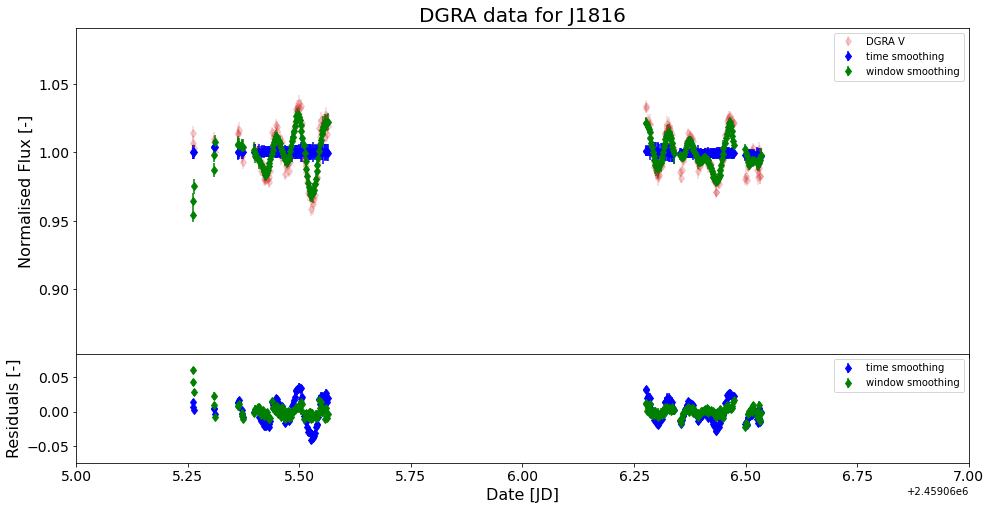

In [8]:
dgra_flux_time   = smooth_time_window([dgra_time], [dgra_flux], 0.4)[0]
dgra_flux_window = smooth_window([dgra_flux], 11)[0]

# plot the data
fig = plt.figure(figsize=(16,8))
ax0 = plt.subplot2grid((4, 1), (0, 0), rowspan=3, colspan=1)
ax0.errorbar(dgra_time, dgra_flux, yerr=dgra_error, fmt=dgra_symbol, color=dgra_color, label=dgra_tel, alpha=0.2)
ax0.errorbar(dgra_time, dgra_flux_time, yerr=dgra_error, fmt=dgra_symbol, color='b', label='time smoothing')
ax0.errorbar(dgra_time, dgra_flux_window, yerr=dgra_error, fmt=dgra_symbol, color='g', label='window smoothing')
ax0.set_ylabel('Normalised Flux [-]', fontsize=16)
ax0.set_title('DGRA data for J1816', fontsize=20)
ax0.set_xlim(2459065, 2459067)
ax0.tick_params(labelsize=14)
ax0.label_outer()
ax0.legend()
ax1 = plt.subplot2grid((4, 1), (3, 0), rowspan=1, colspan=1, sharex=ax0)
ax1.errorbar(dgra_time, dgra_flux-dgra_flux_time, yerr=dgra_error, fmt=dgra_symbol, color='b', label='time smoothing')
ax1.errorbar(dgra_time, dgra_flux-dgra_flux_window, yerr=dgra_error, fmt=dgra_symbol, color='g', label='window smoothing')
ax1.set_xlabel('Date [JD]', fontsize=16)
ax1.set_ylabel('Residuals [-]', fontsize=16)
ax1.legend()
ax1.tick_params(labelsize=14)
fig.subplots_adjust(hspace=0)
plt.show()




From this it is clear that the smooth_time_window( ) is ideal for getting the general trends and smooth_window( ) is ideal for smoothing out the signal (a sort of binning). Let's see what a good <strong>delta time</strong> would be for the smooth_time_window( ) function.

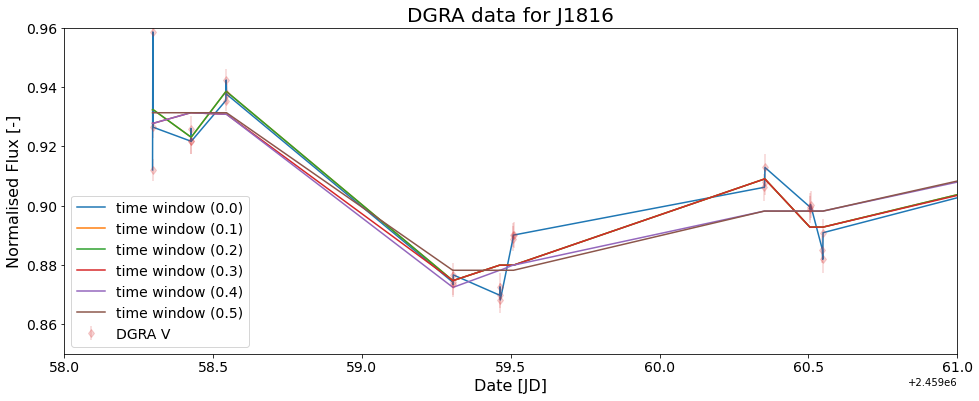

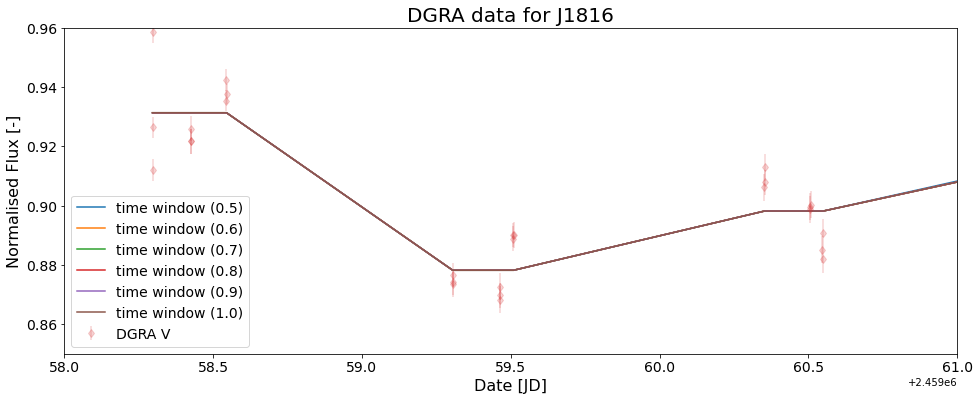

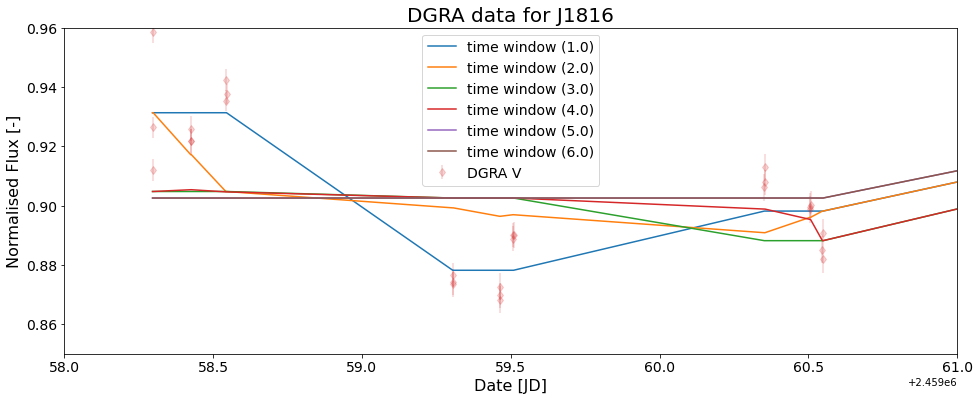

In [9]:
# test different delta times for the smooth_time_window()
delta_times = np.array([0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.5, 0.6, 0.7,
                        0.8, 0.9, 1.0, 1, 2, 3, 4, 5, 6]).reshape((3, 6))

# plot the data
for x in range(3):
    plt.figure(figsize=(16,6))
    plt.errorbar(dgra_time, dgra_flux, yerr=dgra_error, fmt=dgra_symbol, color=dgra_color, label=dgra_tel, alpha=0.2)
    for delta_time in delta_times[x]:
        dgra_flux_time_test = smooth_time_window([dgra_time],[dgra_flux], delta_time)[0]
        plt.plot(dgra_time, dgra_flux_time_test, label='time window (%.1f)' % delta_time)
    plt.xlabel('Date [JD]', fontsize=16)
    plt.ylabel('Normalised Flux [-]', fontsize=16)
    plt.title('DGRA data for J1816', fontsize=20)
    plt.xlim(2459058, 2459061)
    plt.ylim(0.85, 0.96)
    plt.legend(fontsize=14)
    plt.gca().tick_params(labelsize=14)
    plt.show()

From these plots it's clear that the time windows from 0.5 to 1.0 make little to no difference (this makes sense because of the diurnal cycle). So this is equivalent to just taking the mean of the night. Having a smoothed signal larger than one night could smooth out ring features, and less than 0.3 days would follow the pulsations. We adopt the 0.4 day smoothing. 

## Lomb-Scargle Periodograms

Now we will look at all the data remove the non-stellar pulsation trend and then do lomb-scargle periodograms to extract the periods of the stellar oscillations.

In [10]:
# get the dgra smoothed data
dgra_flux_smooth = smooth_time_window([dgra_time], [dgra_flux], 0.4)[0]

# get the quiescent stellar variation (sv) data
dgra_flux_sv = dgra_flux - dgra_flux_smooth

In [11]:
# test how chi2 changes with the number of sinusoids used in the model
num_sin = 100

# empty arrays to save values
pbs = np.zeros((3, num_sin))
chi2s = np.zeros(num_sin)

old_flux = dgra_flux_sv
for x in tqdm(range(num_sin)):
    pb, new_flux = sv.lombscargle_periodogram(dgra_time, old_flux, dgra_error, dt=dgra_time[0], min_period=0.01, 
                                              max_period=0.4, peak_points=100, plot=False)
    pbs[:, x] = pb
    chi2s[x] = np.sum((new_flux / dgra_error)**2) / len(new_flux)
    old_flux = new_flux


100%|██████████| 100/100 [01:04<00:00,  1.56it/s]


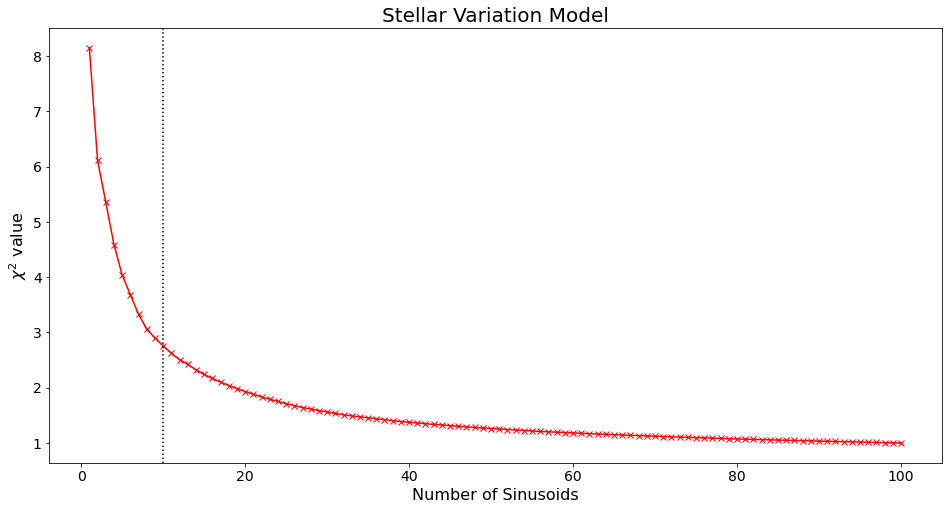

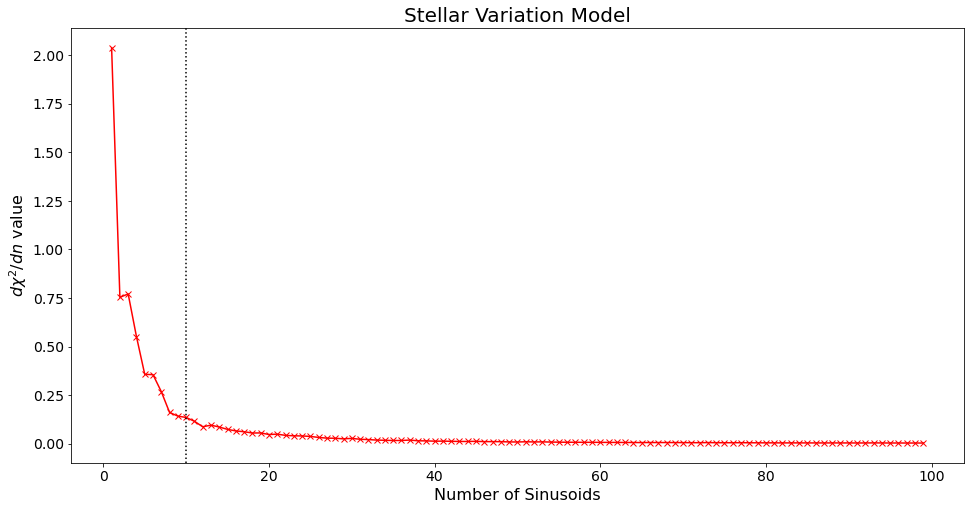

In [12]:
# plot the chi2 w.r.t. n_sin
plt.figure(figsize=(16, 8))
plt.plot(np.arange(num_sin) + 1, chi2s, 'r-x')
plt.xlabel('Number of Sinusoids', fontsize=16)
plt.ylabel('$\chi^2$ value', fontsize=16)
plt.title('Stellar Variation Model', fontsize=20)
plt.gca().tick_params(labelsize=14)
plt.gca().axvline(x=10, color='k', ls=':')
plt.show()

# plot the change in chi2 w.r.t. n_sin
plt.figure(figsize=(16,8))
plt.plot(np.arange(num_sin - 1) + 1, chi2s[:-1] - chi2s[1:], 'r-x')
plt.xlabel('Number of Sinusoids', fontsize=16)
plt.ylabel('$d\chi^2 / dn$ value', fontsize=16)
plt.title('Stellar Variation Model', fontsize=20)
plt.gca().tick_params(labelsize=14)
plt.gca().axvline(x=10, color='k', ls=':')
plt.show()

From this plot we decide to use 10 sinusoids as the improvement is no longer very significant. Also this is reasonable for the MCMC sampling.

In [13]:
# number of sines used onwards
ns = 10

# create pbs
pb_lombscargle = pbs[:, :ns].flatten()

# labels and units
lbls = []
params = ['amplitude', 'period', 'phase']
for param in params:
    for x in range(ns):
        lbls.append(param + ' %i' % (x+1))
    
units = ns * ['L*'] + ns * ['days'] + ns * ['rad']


## MCMC Sampling

We used Lomb Scargle Periodograms to produce the model for the stellar variation, but here we will use an MCMC sampling method to produce a potentially better fit.

In [14]:
# define the model in an emcee fashion (i.e. parameters are model(P, time))
sv_model = lambda P, time: sv.sines(time, P[0*ns:1*ns], P[1*ns:2*ns], P[2*ns:3*ns], dgra_time[0])

In [15]:
# defining boundaries
al, au = (-0.05, 0.05)        # amplitudes of sines
tl, tu = (0., 4.)             # periods of sines
pl, pu = (-2*np.pi, 2*np.pi)  # phases of sines


# define the prior
def sv_prior(P):
    '''
    gives the limit of the parameter space for the model. note that the model
    is always composed of a linear trend and x number of sinusoids

    Parameters
    ----------
    P : list, tuple, array of floats
        contains parameters of the model
            m --> slope of the line
            b --> intercept of the line
            ax --> amplitudes of the sinusoids
            tx --> periods of the sinusoids
            px --> phases of the sinusoids

    Returns
    -------
    prior : float
        0 if in parameter space, - infinity if outside
    '''
    # number of sines (-2 = line; 3 parameters per sine)
    ns = int(len(P) / 3)
    # define bounds
    bounds = ns*[(al, au)] + ns*[(tl, tu)] + ns*[(pl, pu)]
    prior = 0.0
    for param, bound in zip(P, bounds):
        if bound[0] <= param <= bound[1]:
            prior = 0.0
        else:
            prior = -np.inf
            break
    return prior

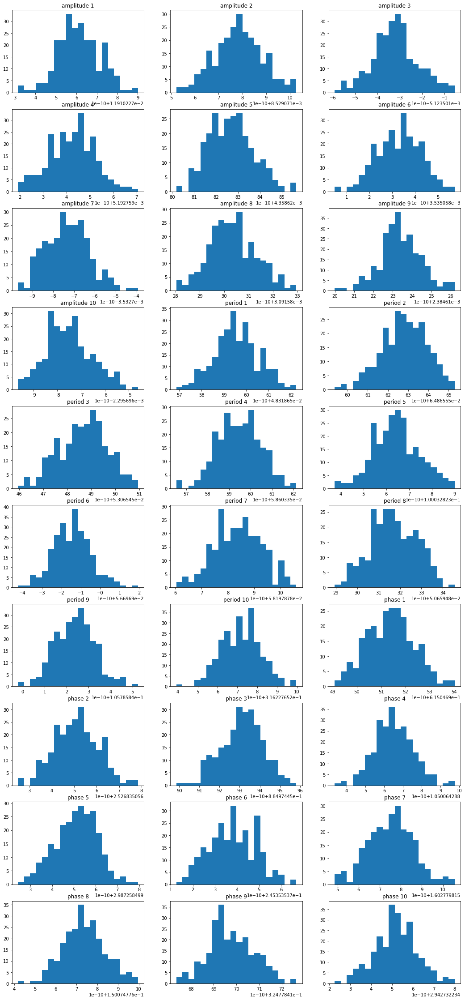

In [16]:
# define boundaries
bounds = ns*[(al, au)] + ns*[(tl, tu)] + ns*[(pl, pu)]

# create initial ball
n_walkers = 250
p0 = mcmc.ball_p0(pb_lombscargle, n_walkers, 1e-10, bounds)

# plot the initial ball
mcmc.plot_hist(p0, lbls=lbls, ncols=3)

In [17]:
# setting savename
be = 'models/mcmc_backends/sv_gb_ns_%i_1e-10.h5' % ns

# run MCMC
args = (dgra_time, dgra_flux_smooth, dgra_error, sv_model, sv_prior)
#_, sampler = mcmc.run_mcmc(*args, p0, 5000, savename=be, reset=True)

# load MCMC
BE = emcee.backends.HDFBackend(be)
sampler = emcee.EnsembleSampler(n_walkers, 3 * ns, mcmc.lnprob, args=args, backend=BE)

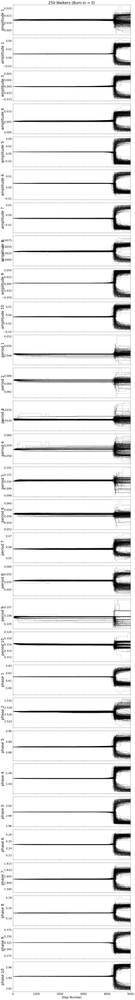

In [18]:
# plot the walkers
mcmc.plot_walkers(sampler, lbls=lbls)

Because of the inter-relatedness of the different sinusoids, it is clear that a very complicated prior is necessary to prevent one sinusoidal component from becoming another one. So we ignore this train of thought. We do however plot the different sinusoids to justify this.

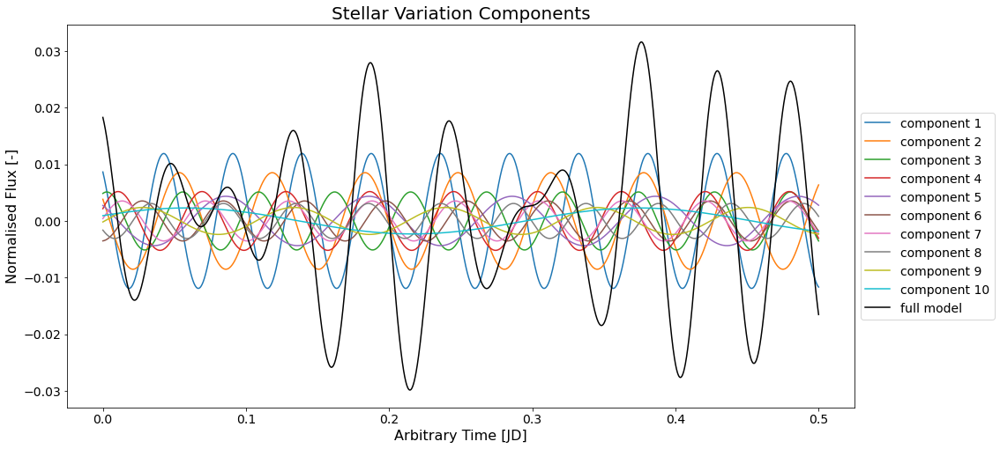

In [19]:
# plot the Lomb Scargle Solutions
ls_time = np.linspace(0, 0.5, 10001)
fig = plt.figure(figsize=(16, 8))
for x in range(ns):
    amplitude = [pb_lombscargle[x]]
    period    = [pb_lombscargle[x + ns]]
    phase     = [pb_lombscargle[x + 2*ns]]
    ls_flux = sv.sines(ls_time, amplitude, period, phase, dgra_time[0])
    plt.plot(ls_time, ls_flux, label='component %i' % (x+1))
plt.plot(ls_time, sv_model(pb_lombscargle, ls_time), 'k-', label='full model')
plt.xlabel('Arbitrary Time [JD]', fontsize=16)
plt.ylabel('Normalised Flux [-]', fontsize=16)
plt.title('Stellar Variation Components', fontsize=20)
plt.legend(fontsize=14, bbox_to_anchor=[1, 0.5], loc='center left')
plt.gca().tick_params(labelsize=14)
plt.show()

This clearly shows that there is a complete mess of sinusoids and that they are not sufficiently removed from each other to use an MCMC routine, without a very complex prior. Thus we say simply that the <strong><em>best_fit = pb_lombscargle</em></strong>.

In [20]:
best_fit = pb_lombscargle

## Comparison to Other Data

To validate the model we must compare the model produced by <strong>DGRA</strong> to other observers and other wavebands to ensure that this is not a location or instrumental effect. We look always at high cadence data (one data point per night is simply not enough) and start with other $V$ band data before looking at other filters.

### V Band Data

We compare stellar model to all high cadence $V$ band data: <strong>DGRA</strong>, <strong>TTG</strong>, <strong>OAAA</strong>, <strong>MMEA</strong>, and <strong>KNAA</strong>.

In [21]:
# v band indices
V_inds = [3, 11, 18, 21, 24]

# get data and extract
vband_data = get_multiple(times, fluxes, errors, telescopes, shifts, symbols, V_inds, bin_size=bs)
vtimes, vfluxes, verrors, vtels, vsymbols, vcolors, vpfits, vtls = vband_data


extracting DGRA V
extracting KNAA V
extracting MMEA V
extracting OAAA V
extracting TTG V


We smooth the data to extract and remove the trend leaving the quiescent light curve.

In [22]:
# find the trend in the data and remove it
vfluxes_smooth = smooth_time_window(vtimes, vfluxes, 0.4)

# get trend-free data
vfluxes_sv = []
for vflux, vflux_smooth in zip(vfluxes, vfluxes_smooth):
    vfluxes_sv.append(vflux - vflux_smooth)


We plot the data to see how well it fits.

there is data between 2459046 and 2459135, which is 89 days


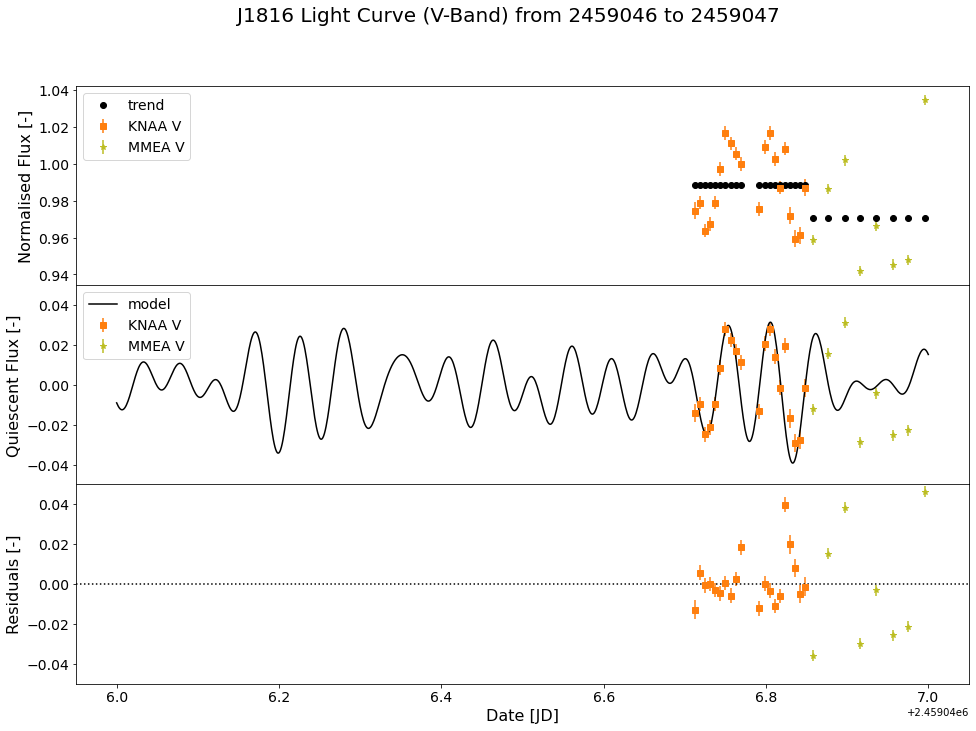

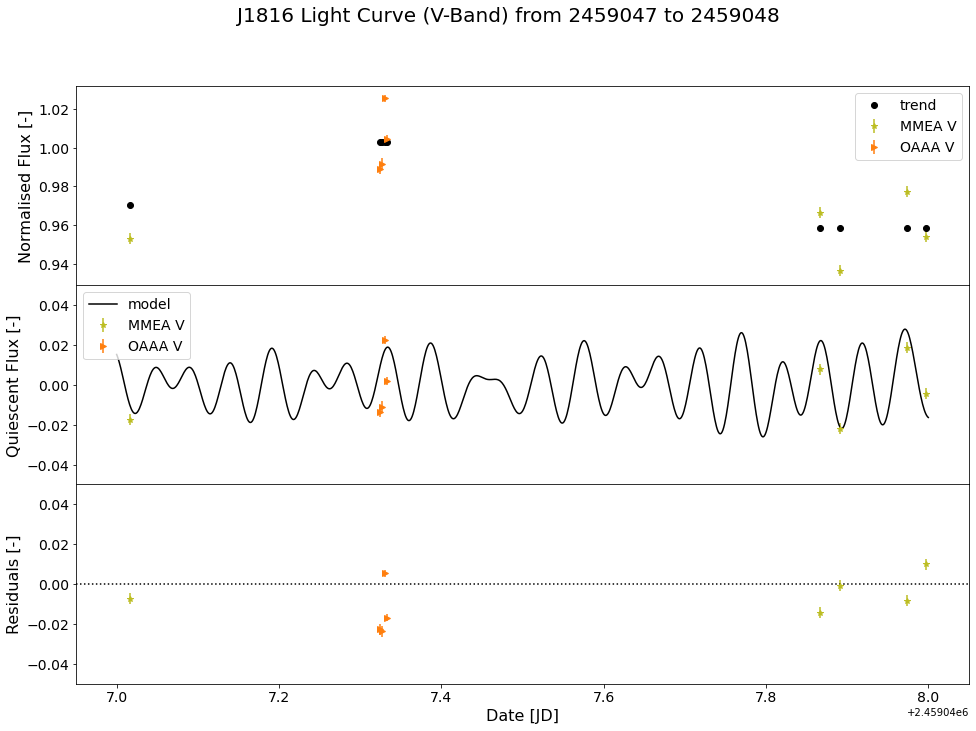

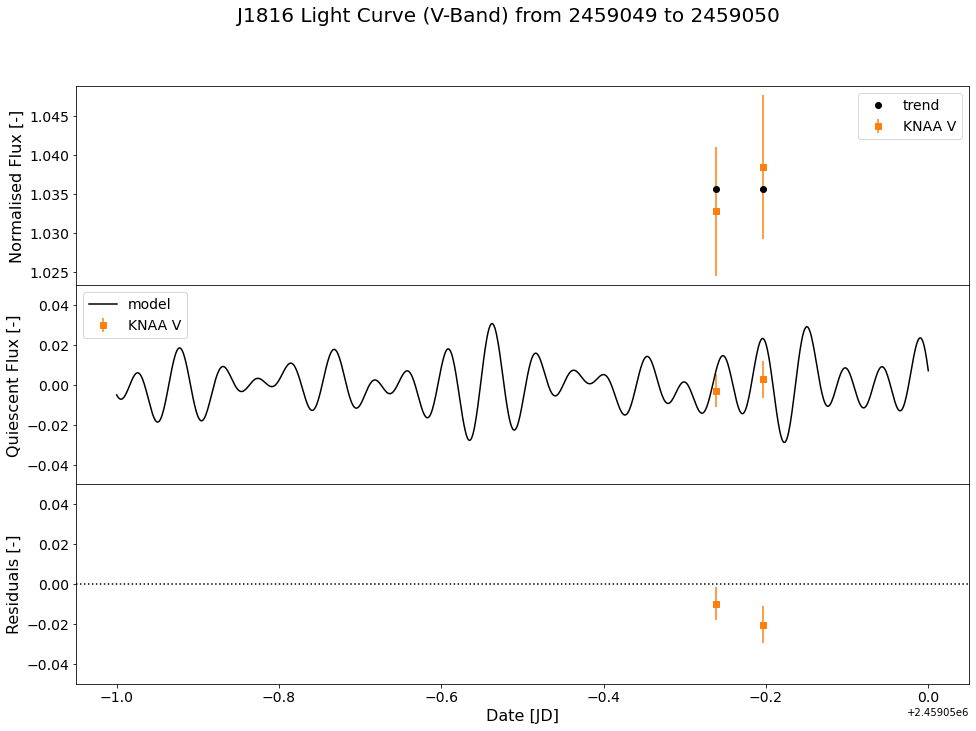

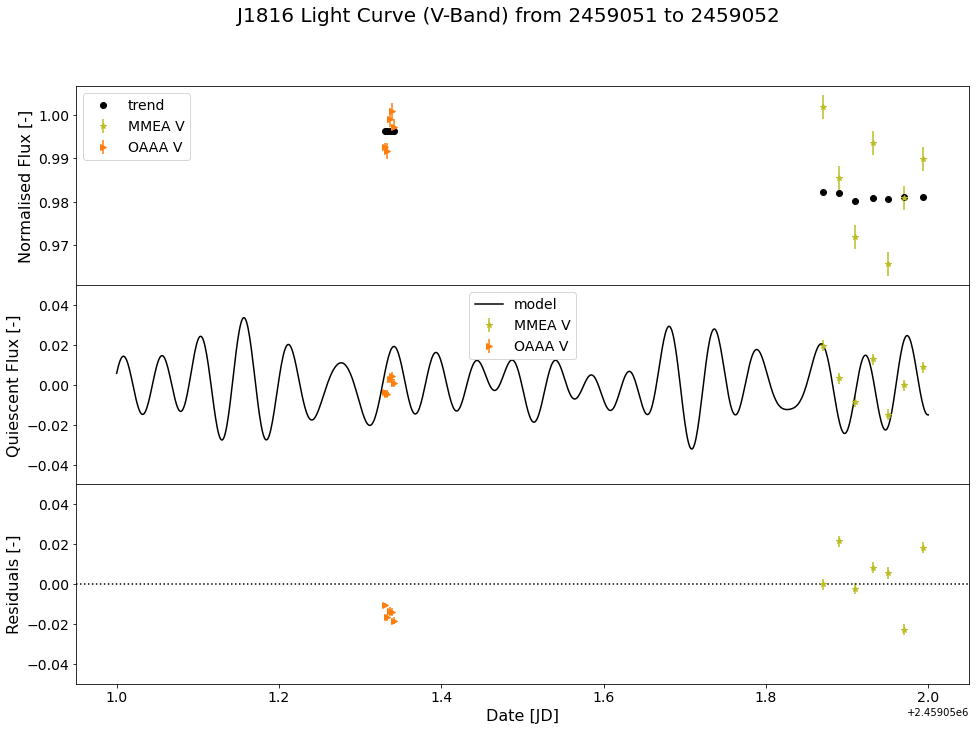

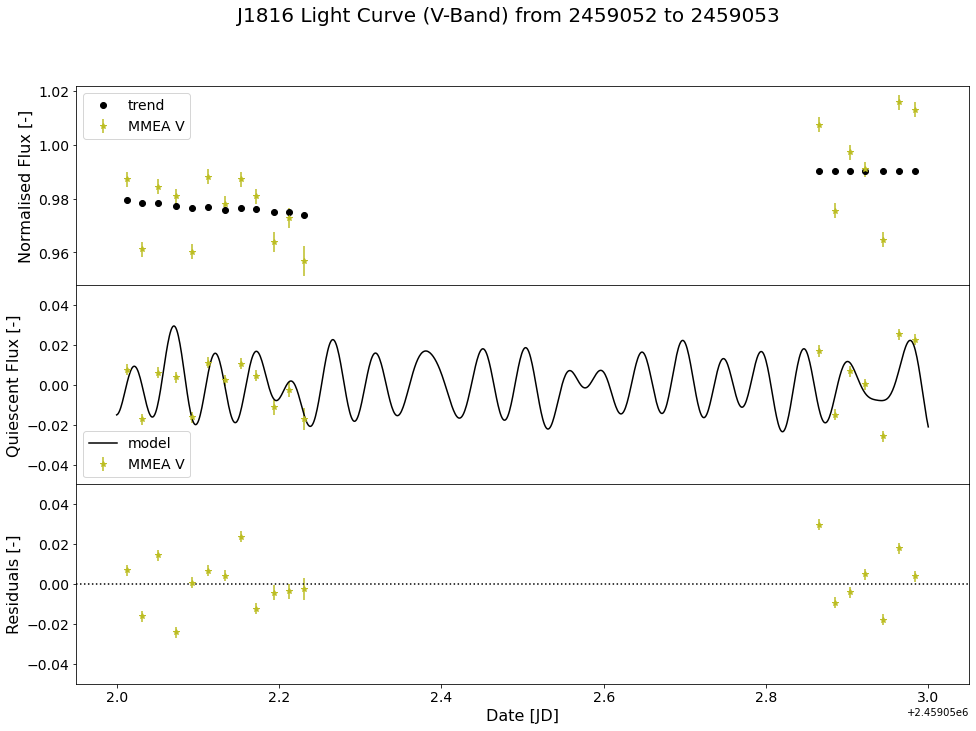

...

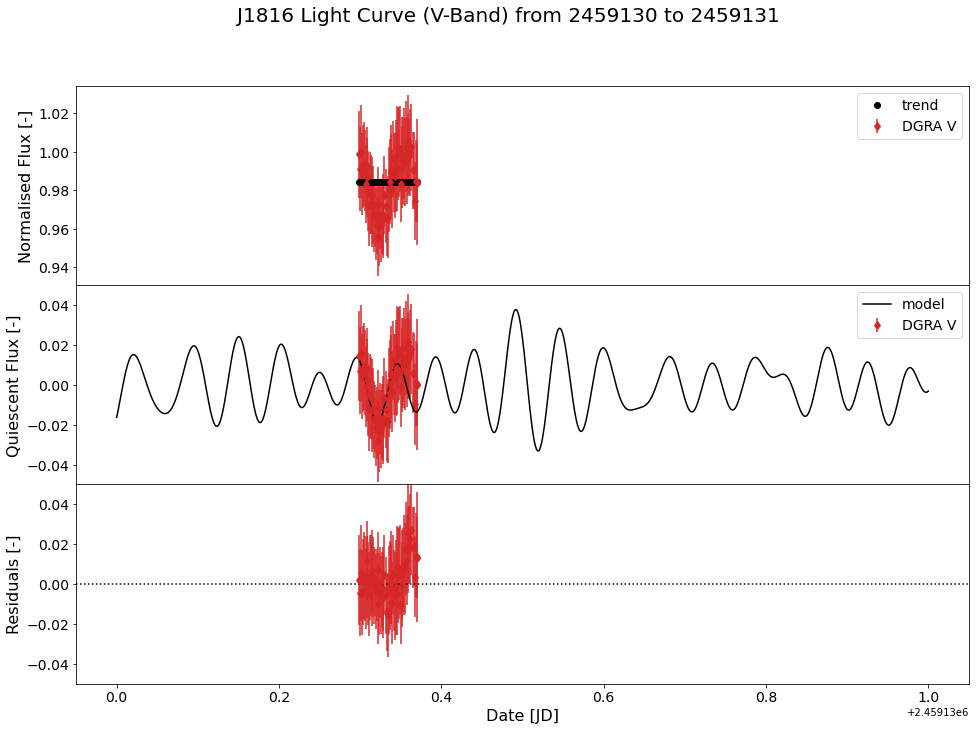

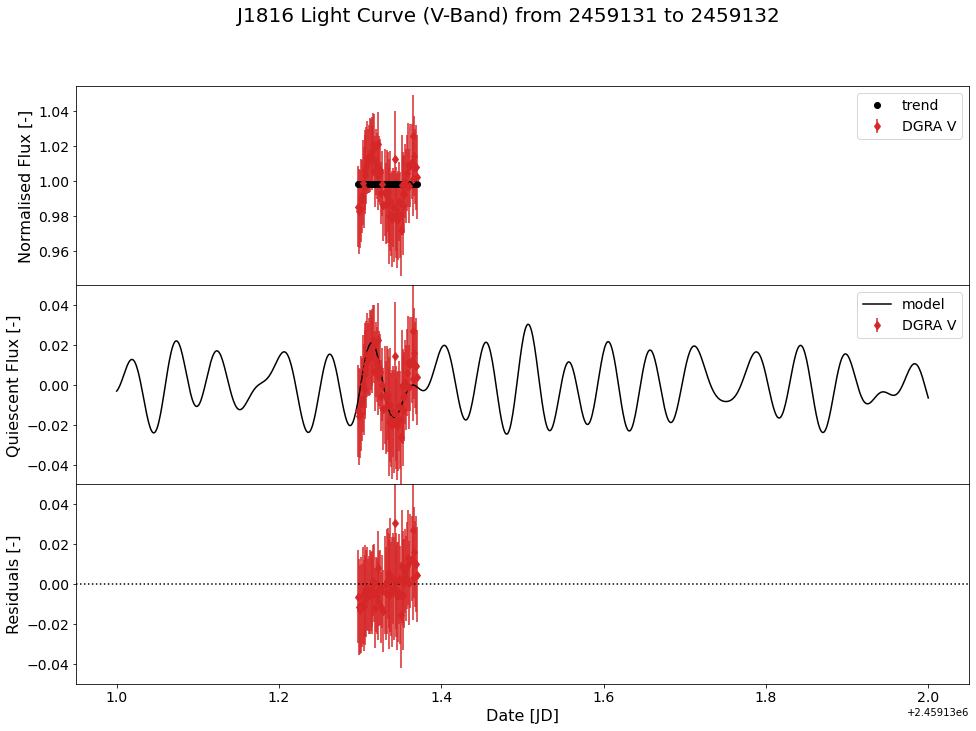

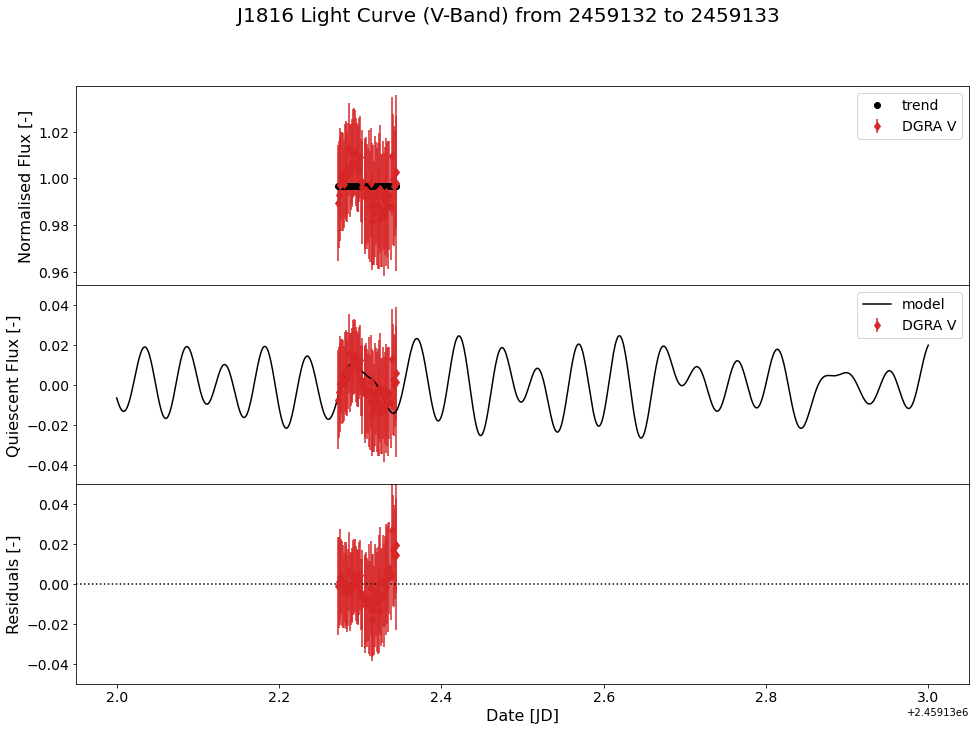

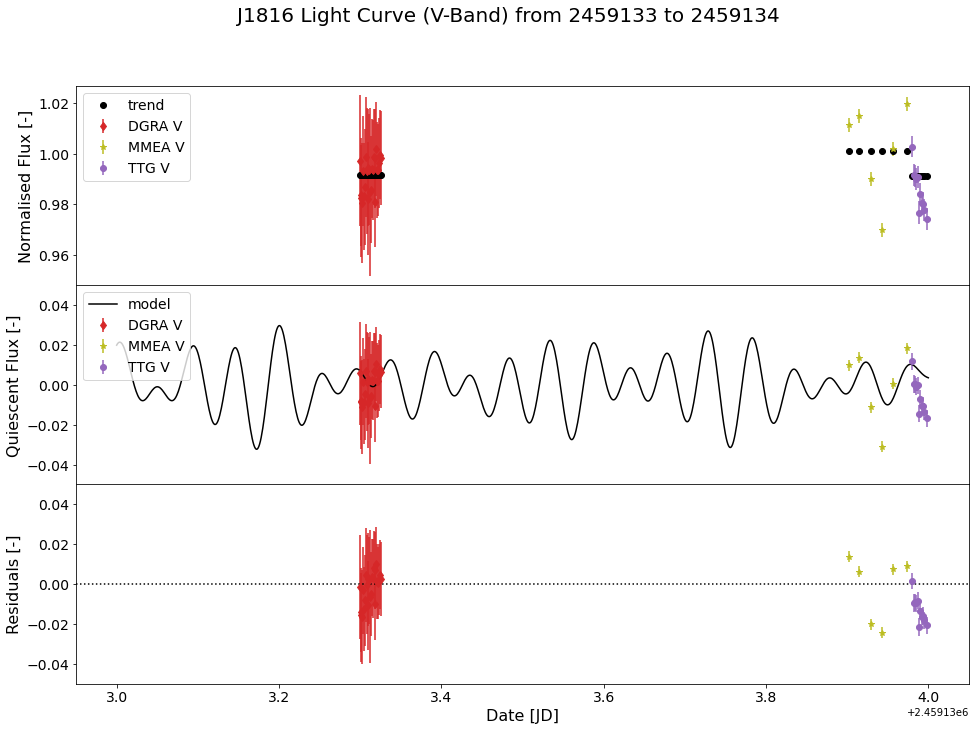

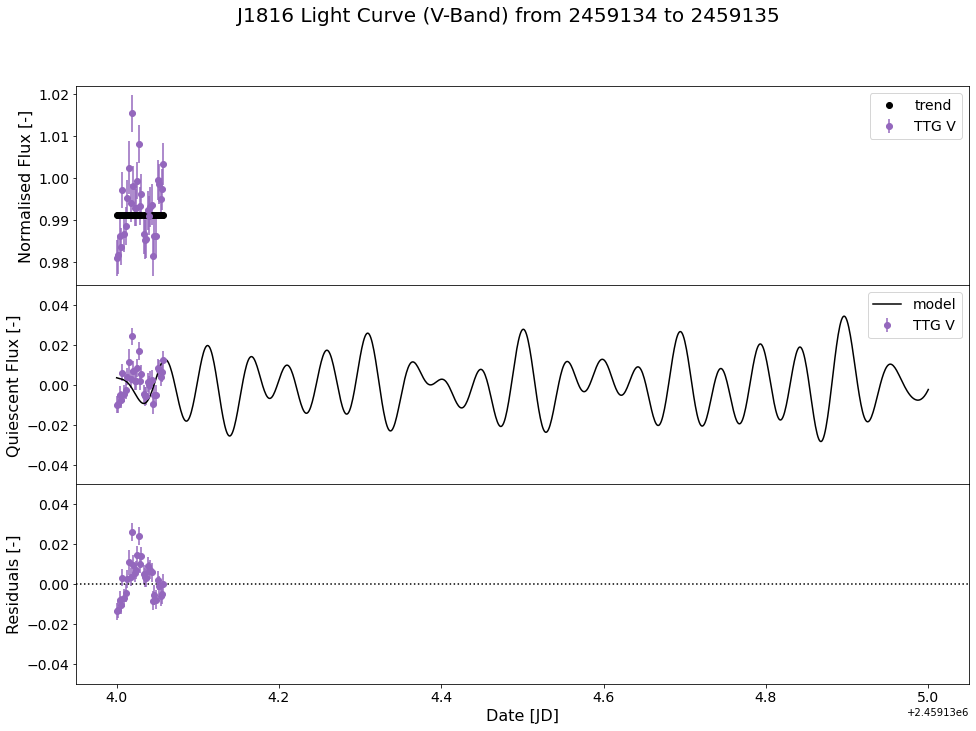

In [23]:
# determine time range
tmin = 1e10
tmax = 0
for time in vtimes:
    if time[0] < tmin:
        tmin = time[0]
    if time[-1] > tmax:
        tmax = time[-1]
tmin = np.floor(tmin)
tmax = np.ceil(tmax)

dt = 1
print('there is data between %i and %i, which is %i days' % (tmin, tmax, tmax-tmin))

while tmin < tmax:
    label = 'trend'
    alpha = 1
    tot = 0
    fig = plt.figure(figsize=(16, 11))
    fig.suptitle('J1816 Light Curve (V-Band) from %i to %i' % (tmin, tmin + dt), fontsize=20)
    ax0 = plt.subplot2grid((3, 1), (0, 0), rowspan=1, colspan=1)
    ax0.set_ylabel('Normalised Flux [-]', fontsize=16)
    ax0.tick_params(labelsize=14)
    ax1 = plt.subplot2grid((3, 1), (1, 0), rowspan=1, colspan=1, sharex=ax0)
    ax1.set_ylabel('Quiescent Flux [-]', fontsize=16)
    ax1.tick_params(labelsize=14)
    ax2 = plt.subplot2grid((3, 1), (2, 0), rowspan=1, colspan=1, sharex=ax0)
    ax2.set_ylabel('Residuals [-]', fontsize=16)
    ax2.set_xlabel('Date [JD]', fontsize=16)
    ax2.tick_params(labelsize=14)
    zip_params = (vtimes, vfluxes, vfluxes_smooth, vfluxes_sv, verrors, vtels, vsymbols, vcolors)
    for vtime, vflux, vflux_smooth, vflux_sv, verror, vtel, vsymbol, vcolor in zip(*zip_params):
        mask = (vtime >= tmin) * (vtime <= tmin + dt)
        if np.sum(mask) > 0:
            tot += np.sum(mask)
            # top plot
            ax0.errorbar(vtime[mask], vflux[mask], yerr=verror[mask], fmt=vsymbol, 
                         color=vcolor, label=vtel, alpha=alpha)
            ax0.plot(vtime[mask], vflux_smooth[mask], 'ko', lw=4, label=label)
            # middle plot
            ax1.errorbar(vtime[mask], vflux_sv[mask], yerr=verror[mask], fmt=vsymbol, 
                         color=vcolor, label=vtel, alpha=alpha)
            # bottom plot
            model_flux = sv_model(best_fit, vtime[mask])
            ax2.errorbar(vtime[mask], vflux_sv[mask] - model_flux, yerr=verror[mask], fmt=vsymbol,
                        color=vcolor, label=vtel, alpha=alpha)
            label=None
    # extra lines
    model_time = np.linspace(tmin, tmin + dt, 1001)
    model_flux = sv_model(best_fit, model_time)
    ax1.plot(model_time, model_flux, 'k-', label='model')
    ax2.axhline(y=0, color='k', ls=':')
    # set ylims
    ax1.set_ylim(-0.05, 0.05)
    ax2.set_ylim(-0.05, 0.05)
    if tot > 0:
        # legends
        ax0.legend(fontsize=14)
        ax1.legend(fontsize=14)
        fig.subplots_adjust(hspace=0)
        plt.savefig('plots/stellar_variation/vband/%i_%i.png' % (tmin, tmin+dt))
        plt.show()
    plt.close()
    tmin += dt
    
    

From these plots it is very clear that <strong>DGRA</strong>, <strong>TTG</strong>, <strong>OAAA</strong>, <strong>MMEA</strong>, and <strong>KNAA</strong> all seem to follow the stellar variation model to a reasonable degree. For comparisons sake we can fit a new model to all the quiescent data and see how this changes.

In [24]:
# produce one data set to create the stellar model
vtime_all_sv  = np.zeros(0)
vflux_all_sv  = np.zeros(0)
verror_all_sv = np.zeros(0)

# concatenate
for vtime, vflux_sv, verror in zip(vtimes, vfluxes_sv, verrors):
    vtime_all_sv  = np.concatenate((vtime_all_sv, vtime), 0)
    vflux_all_sv  = np.concatenate((vflux_all_sv, vflux_sv), 0)
    verror_all_sv = np.concatenate((verror_all_sv, verror), 0)

# sort
sort_mask = np.argsort(vtime_all_sv)
vtime_all_sv  = vtime_all_sv[sort_mask]
vflux_all_sv  = vflux_all_sv[sort_mask]
verror_all_sv = verror_all_sv[sort_mask]

In [25]:
# test how chi2 changes with the number of sinusoids used in the model
num_sin = 100

# empty arrays to save values
pbs_all = np.zeros((3, num_sin))
chi2s_all = np.zeros(num_sin)

old_flux = vflux_all_sv
for x in tqdm(range(num_sin)):
    pb, new_flux = sv.lombscargle_periodogram(vtime_all_sv, old_flux, verror_all_sv, dt=dgra_time[0],
                                              min_period=0.01, max_period=0.4, peak_points=100, plot=False)
    pbs_all[:, x] = pb
    chi2s_all[x] = np.sum((new_flux / verror_all_sv)**2) / len(new_flux)
    old_flux = new_flux



100%|██████████| 100/100 [02:38<00:00,  1.58s/it]


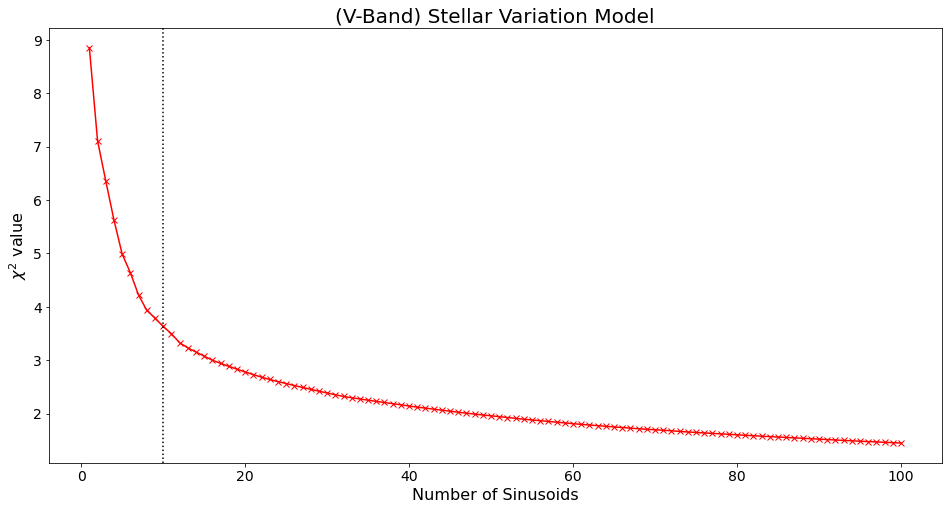

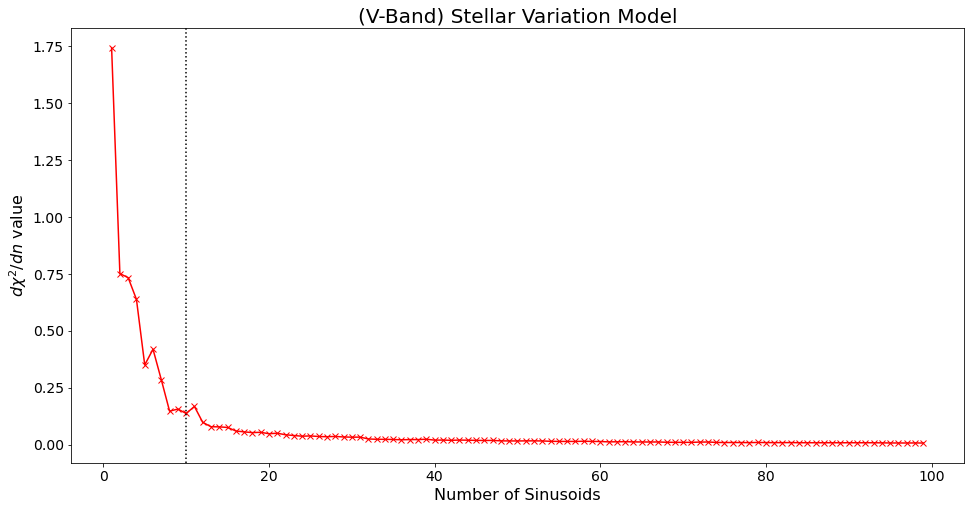

In [26]:
# plot the chi2 w.r.t. n_sin
plt.figure(figsize=(16, 8))
plt.plot(np.arange(num_sin) + 1, chi2s_all, 'r-x')
plt.xlabel('Number of Sinusoids', fontsize=16)
plt.ylabel('$\chi^2$ value', fontsize=16)
plt.title('(V-Band) Stellar Variation Model', fontsize=20)
plt.gca().tick_params(labelsize=14)
plt.gca().axvline(x=10, color='k', ls=':')
plt.show()

# plot the change in chi2 w.r.t. n_sin
plt.figure(figsize=(16,8))
plt.plot(np.arange(num_sin - 1) + 1, chi2s_all[:-1] - chi2s_all[1:], 'r-x')
plt.xlabel('Number of Sinusoids', fontsize=16)
plt.ylabel('$d\chi^2 / dn$ value', fontsize=16)
plt.title('(V-Band) Stellar Variation Model', fontsize=20)
plt.gca().tick_params(labelsize=14)
plt.gca().axvline(x=10, color='k', ls=':')
plt.show()

In [27]:
# create best fit
best_fit_all = pbs_all[:, :ns].flatten()

We compare the best fit for all the data with the best fit with just the <strong>DGRA</strong> data.

In [28]:
# get model flux values
dgra_flux = sv_model(best_fit, vtime_all_sv)
all_flux  = sv_model(best_fit_all, vtime_all_sv)

# calculate chi2
chi2_all_dgra = np.sum(((vflux_all_sv - dgra_flux) / verror_all_sv)**2) / len(vflux_all_sv)
chi2_all_all  = np.sum(((vflux_all_sv - all_flux) / verror_all_sv)**2) / len(vflux_all_sv)

# print values
print('chi2 (DGRA) = %.4f' % chi2_all_dgra)
print('chi2 (all)  = %.4f' % chi2_all_all)

chi2 (DGRA) = 4.1663
chi2 (all)  = 19.7896


This tells us that the best fit model obtained from just the <strong>DGRA</strong> data is more feasible than the solution constructed from all the data (significantly better). So we keep the best fit solution.

### R Band

In $R$ band we can look at how well the model fits the data from <strong>OAAA</strong>, <strong>MMEA</strong> and <strong>KNAA</strong>.

In [29]:
# r band indices
R_inds = [10, 17, 20]

# get data and extract
rband_data = get_multiple(times, fluxes, errors, telescopes, shifts, symbols, R_inds, bin_size=bs)
rtimes, rfluxes, rerrors, rtels, rsymbols, rcolors, rpfits, rtls = rband_data


extracting KNAA R
extracting MMEA R
extracting OAAA R


We smooth the data to extract and remove the trend leaving the quiescent light curve.

In [30]:
# find the trend in the data and remore it
rfluxes_smooth = smooth_time_window(rtimes, rfluxes, 0.4)

# get trend-free data
rfluxes_sv = []
for rflux, rflux_smooth in zip(rfluxes, rfluxes_smooth):
    rfluxes_sv.append(rflux - rflux_smooth)


We plot the data to see how well it fits.

there is data between 2459046 and 2459134, which is 88 days


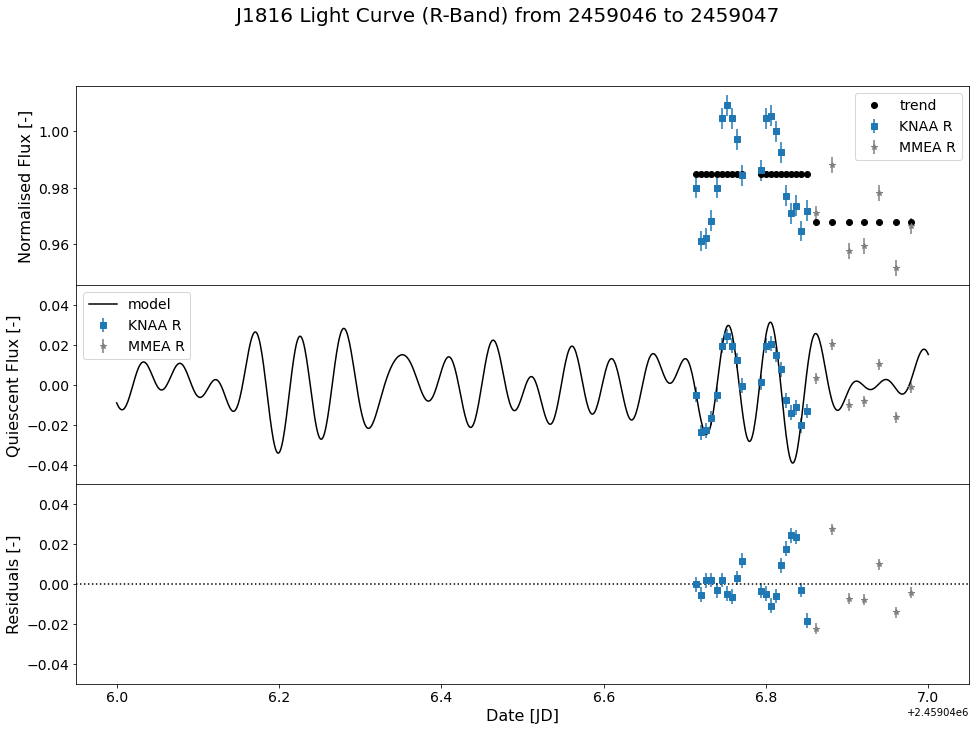

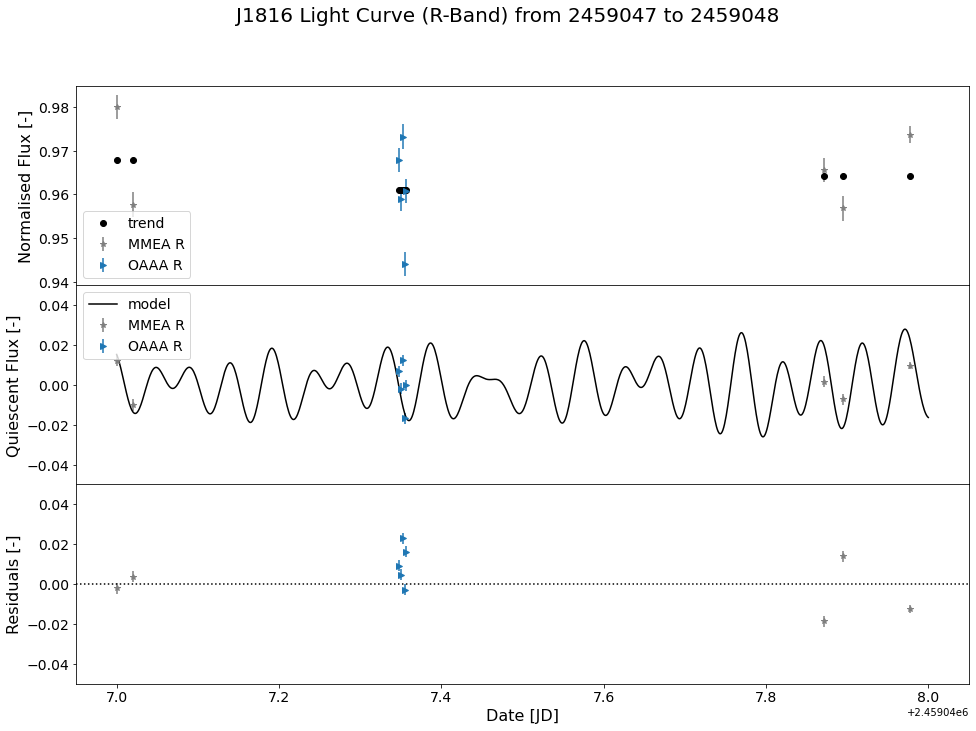

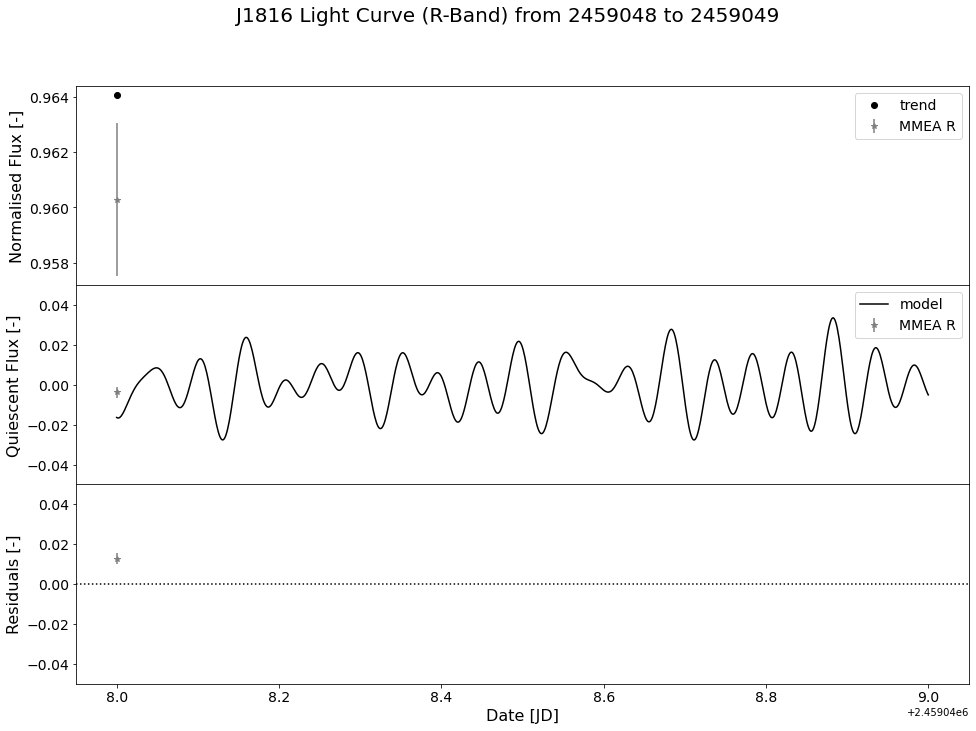

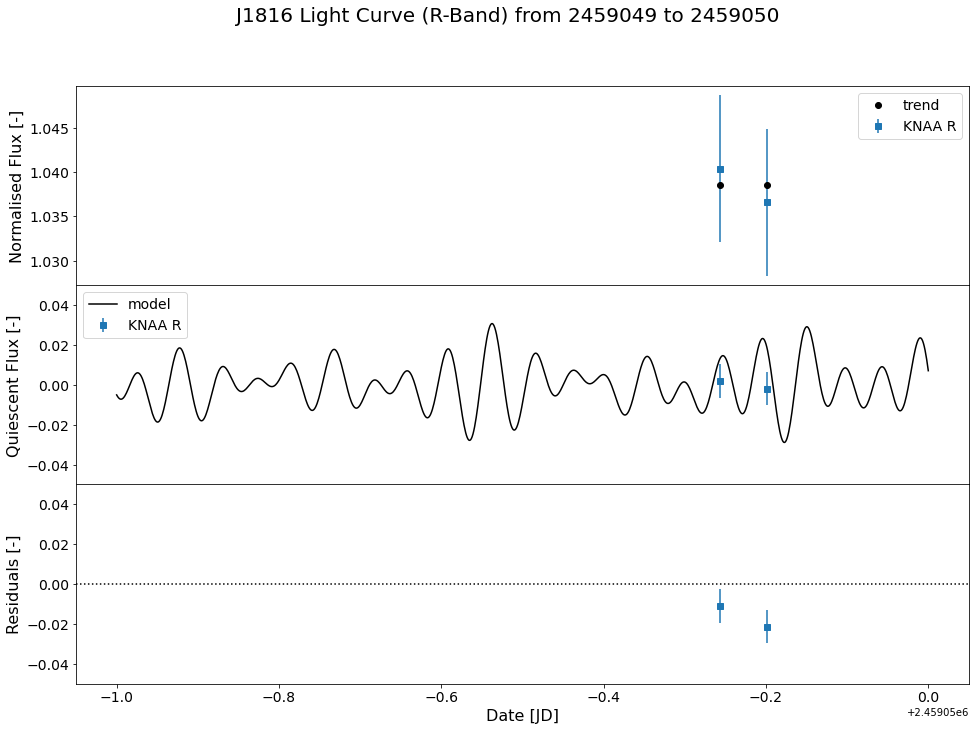

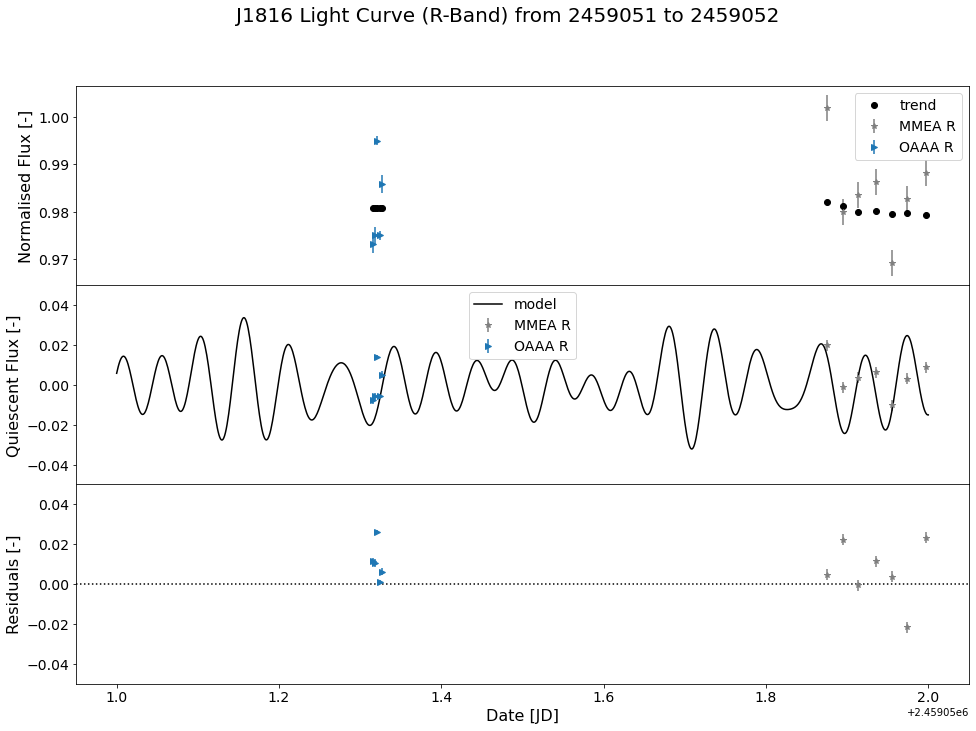

...

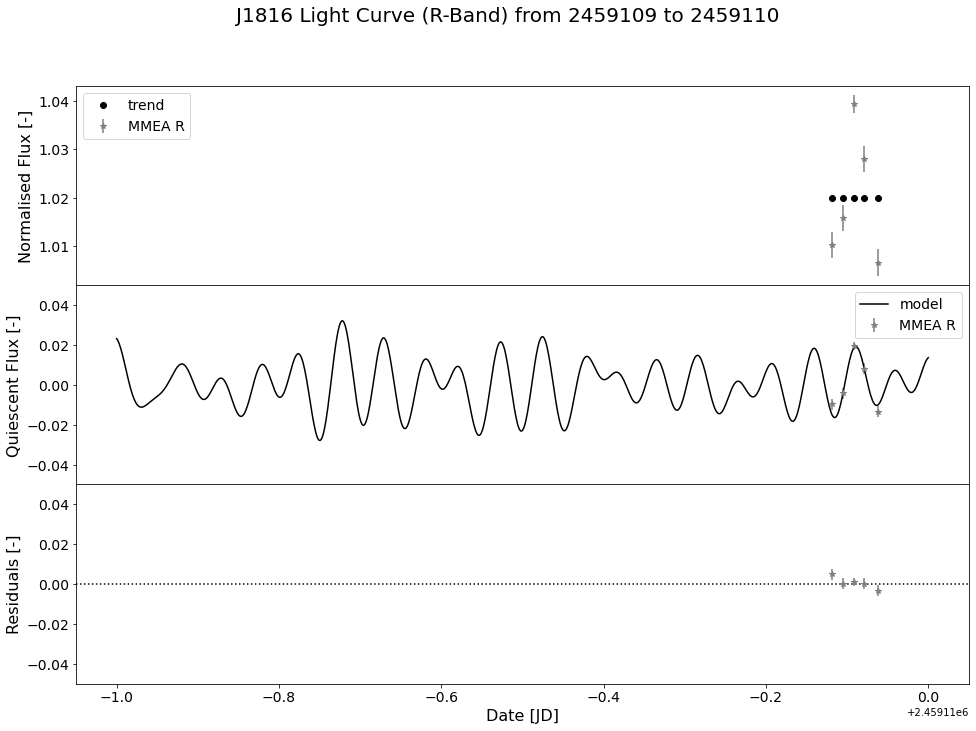

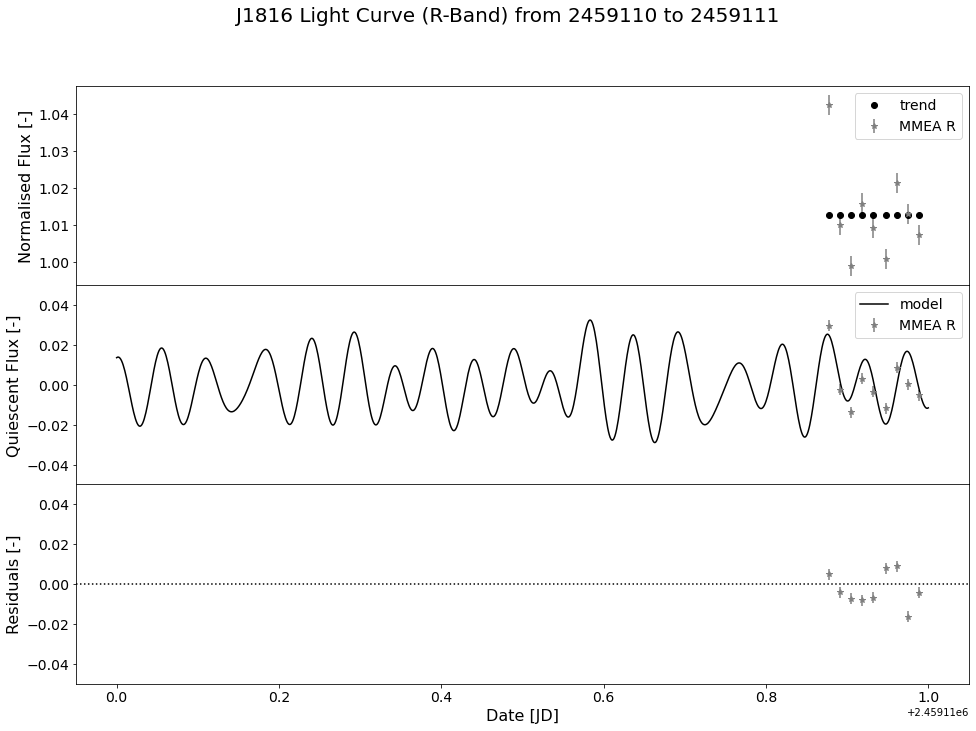

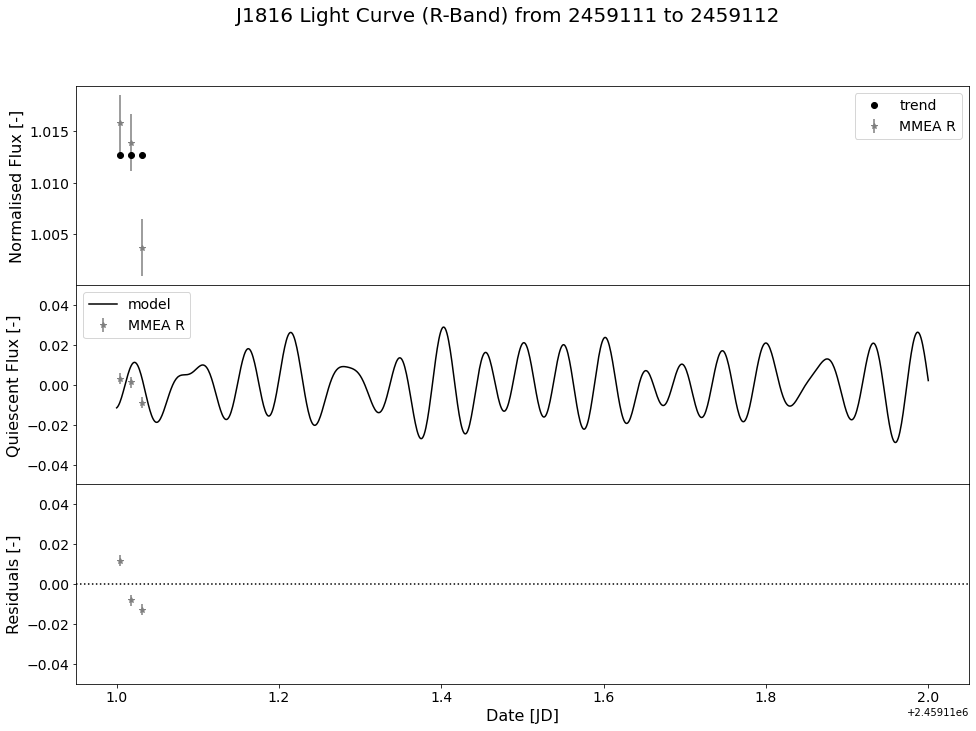

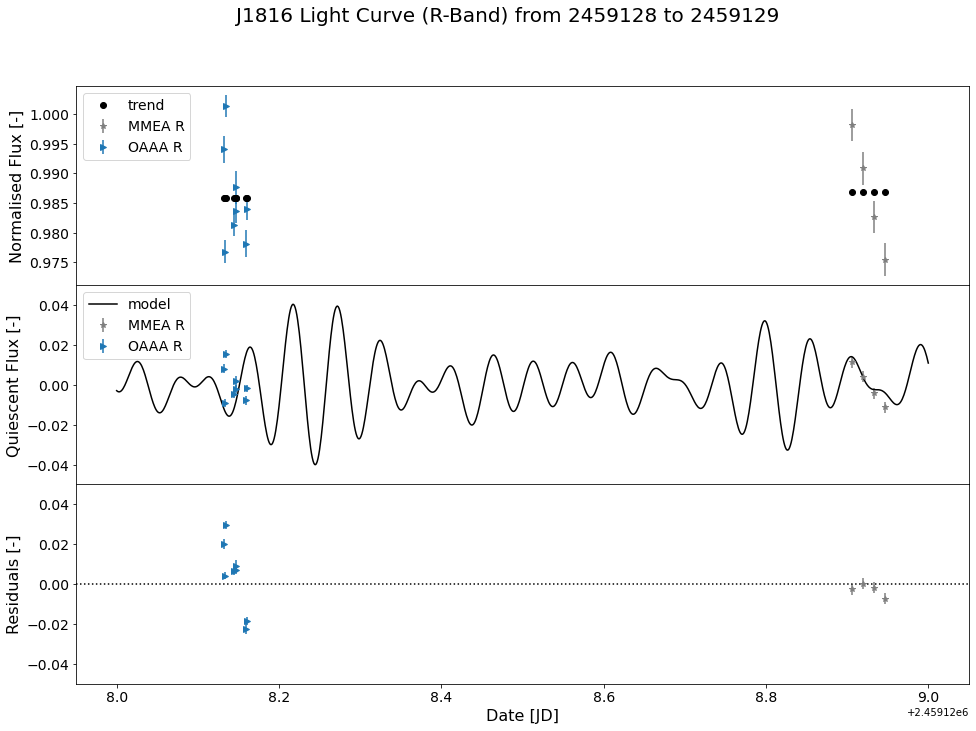

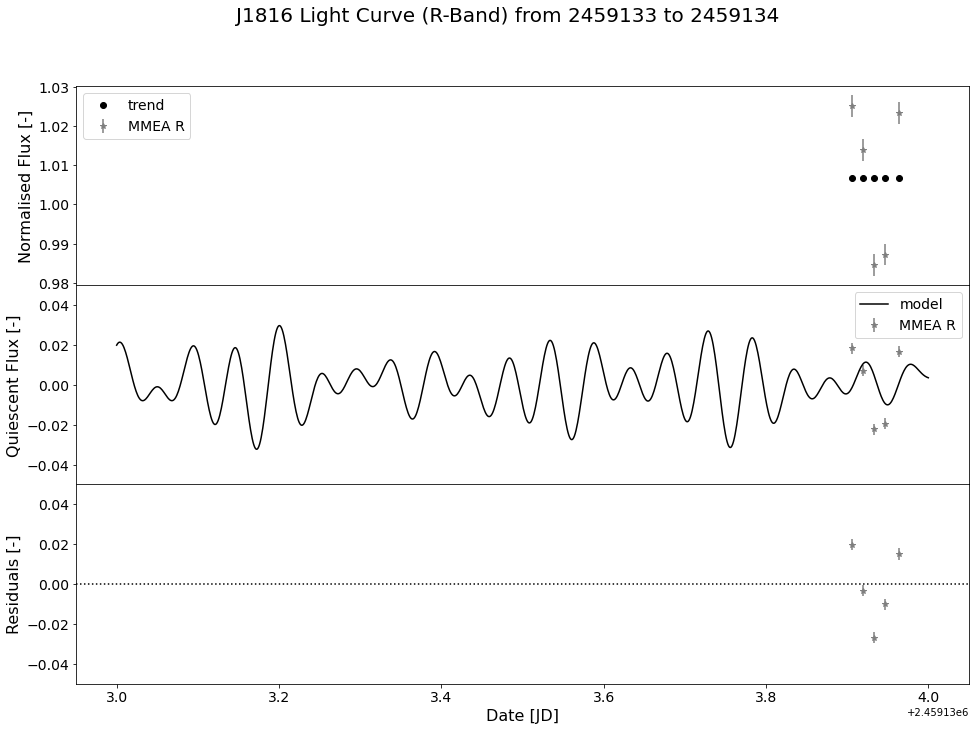

In [31]:
# determine time range
tmin = 1e10
tmax = 0
for time in rtimes:
    if time[0] < tmin:
        tmin = time[0]
    if time[-1] > tmax:
        tmax = time[-1]
tmin = np.floor(tmin)
tmax = np.ceil(tmax)

dt = 1
print('there is data between %i and %i, which is %i days' % (tmin, tmax, tmax-tmin))

while tmin < tmax:
    label = 'trend'
    alpha = 1
    tot = 0
    fig = plt.figure(figsize=(16, 11))
    fig.suptitle('J1816 Light Curve (R-Band) from %i to %i' % (tmin, tmin + dt), fontsize=20)
    ax0 = plt.subplot2grid((3, 1), (0, 0), rowspan=1, colspan=1)
    ax0.set_ylabel('Normalised Flux [-]', fontsize=16)
    ax0.tick_params(labelsize=14)
    ax1 = plt.subplot2grid((3, 1), (1, 0), rowspan=1, colspan=1, sharex=ax0)
    ax1.set_ylabel('Quiescent Flux [-]', fontsize=16)
    ax1.tick_params(labelsize=14)
    ax2 = plt.subplot2grid((3, 1), (2, 0), rowspan=1, colspan=1, sharex=ax0)
    ax2.set_ylabel('Residuals [-]', fontsize=16)
    ax2.set_xlabel('Date [JD]', fontsize=16)
    ax2.tick_params(labelsize=14)
    zip_params = (rtimes, rfluxes, rfluxes_smooth, rfluxes_sv, rerrors, rtels, rsymbols, rcolors)
    for rtime, rflux, rflux_smooth, rflux_sv, rerror, rtel, rsymbol, rcolor in zip(*zip_params):
        mask = (rtime >= tmin) * (rtime <= tmin + dt)
        if np.sum(mask) > 0:
            tot += np.sum(mask)
            # top plot
            ax0.errorbar(rtime[mask], rflux[mask], yerr=rerror[mask], fmt=rsymbol, 
                         color=rcolor, label=rtel, alpha=alpha)
            ax0.plot(rtime[mask], rflux_smooth[mask], 'ko', lw=4, label=label)
            # middle plot
            ax1.errorbar(rtime[mask], rflux_sv[mask], yerr=rerror[mask], fmt=rsymbol, 
                         color=rcolor, label=rtel, alpha=alpha)
            # bottom plot
            model_flux = sv_model(best_fit, rtime[mask])
            ax2.errorbar(rtime[mask], rflux_sv[mask] - model_flux, yerr=rerror[mask], fmt=rsymbol,
                        color=rcolor, label=rtel, alpha=alpha)
            label=None
    # extra lines
    model_time = np.linspace(tmin, tmin + dt, 1001)
    model_flux = sv_model(best_fit, model_time)
    ax1.plot(model_time, model_flux, 'k-', label='model')
    ax2.axhline(y=0, color='k', ls=':')
    # set ylims
    ax1.set_ylim(-0.05, 0.05)
    ax2.set_ylim(-0.05, 0.05)
    if tot > 0:
        # legends
        ax0.legend(fontsize=14)
        ax1.legend(fontsize=14)
        fig.subplots_adjust(hspace=0)
        plt.savefig('plots/stellar_variation/rband/%i_%i.png' % (tmin, tmin+dt))
        plt.show()
    plt.close()
    tmin += dt
    
    

From these plots it is quite clear that <strong>OAAA</strong>, <strong>MMEA</strong>, and <strong>KNAA</strong> all seem to follow the stellar variation model to a reasonable degree. The change in amplitude is not significant visually.

### I Band

In $I$ band we can look at how well the model fits the data from <strong>KNAA</strong> and <strong>SREB</strong>.

In [32]:
# i band indices
I_inds = [9, 23]

# get data and extiact
iband_data = get_multiple(times, fluxes, errors, telescopes, shifts, symbols, I_inds, bin_size=bs)
itimes, ifluxes, ierrors, itels, isymbols, icolors, ipfits, itls = iband_data


extracting KNAA I
extracting SREB I


We smooth the data to extract and remove the trend leaving the quiescent light curve.

In [33]:
# find the trend in the data and remove it
ifluxes_smooth = smooth_time_window(itimes, ifluxes, 0.4)

# get trend-free data
ifluxes_sv = []
for iflux, iflux_smooth in zip(ifluxes, ifluxes_smooth):
    ifluxes_sv.append(iflux - iflux_smooth)

We plot the data to see how well it fits.

there is data between 2459045 and 2459073, which is 28 days


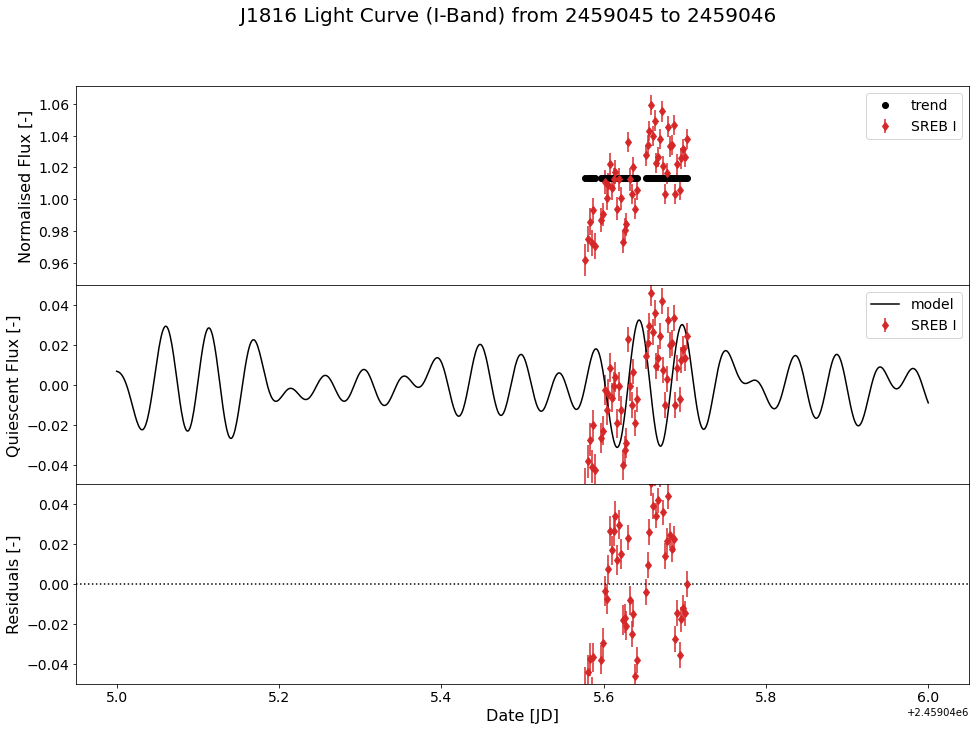

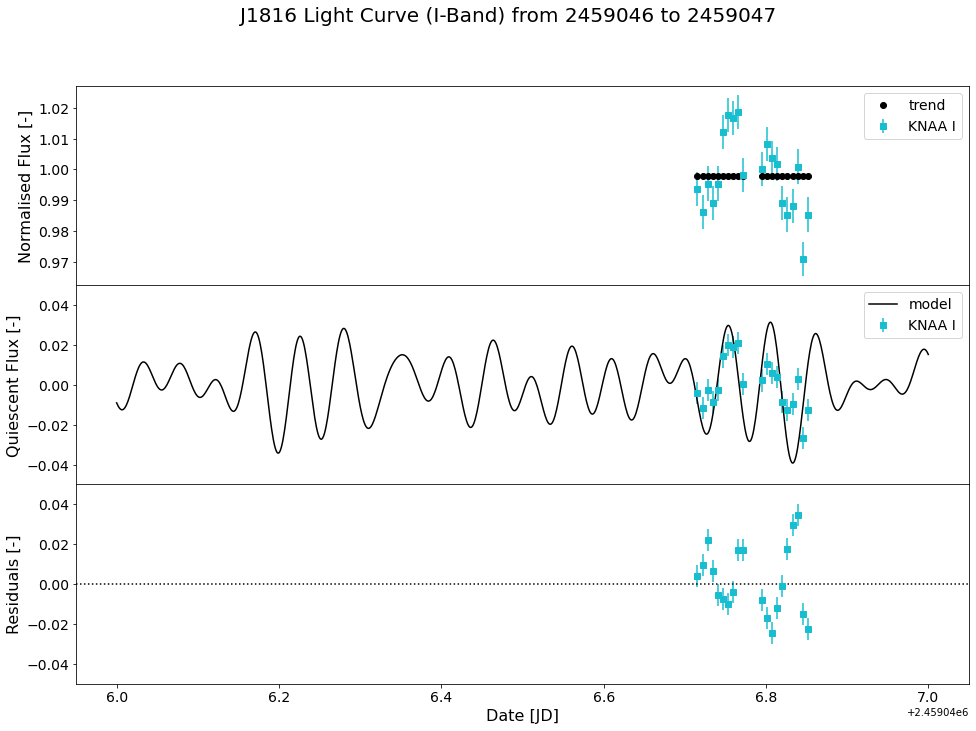

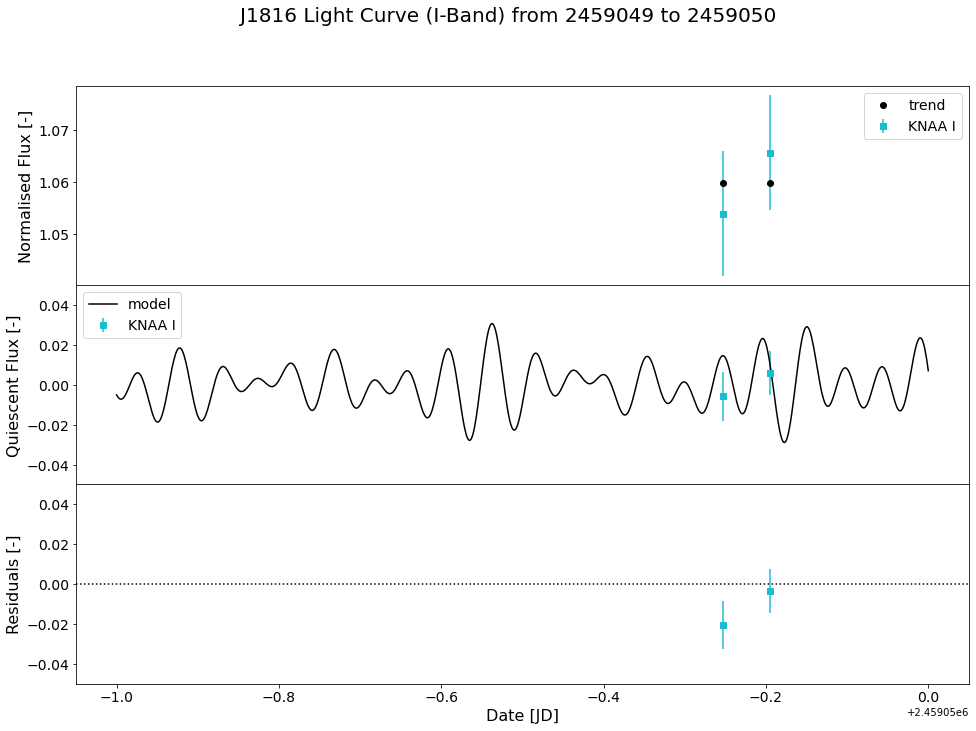

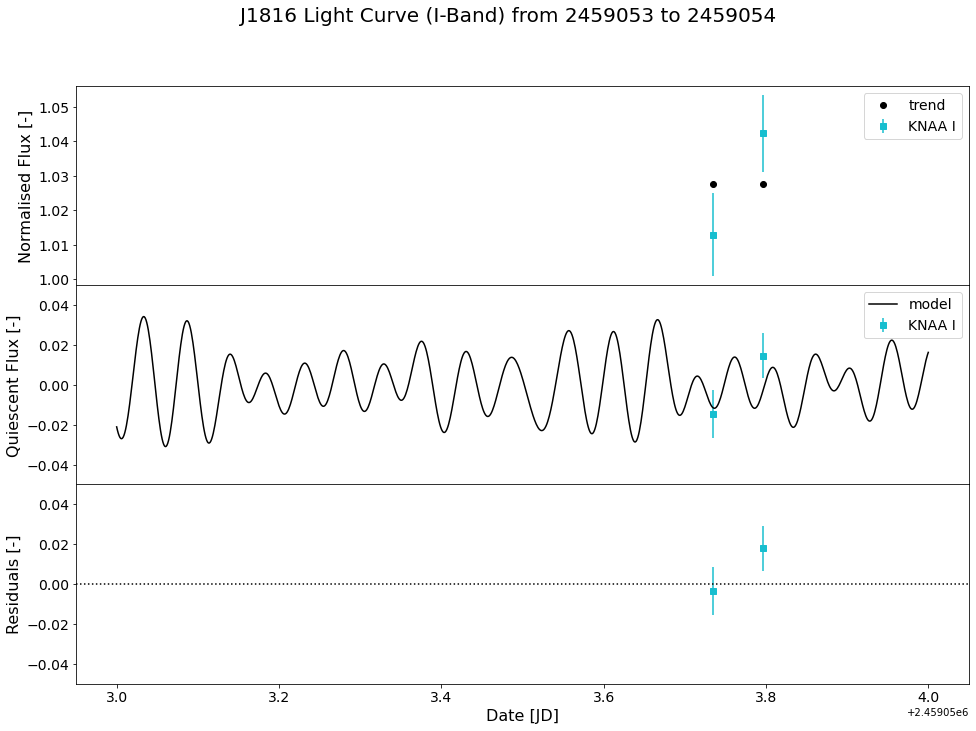

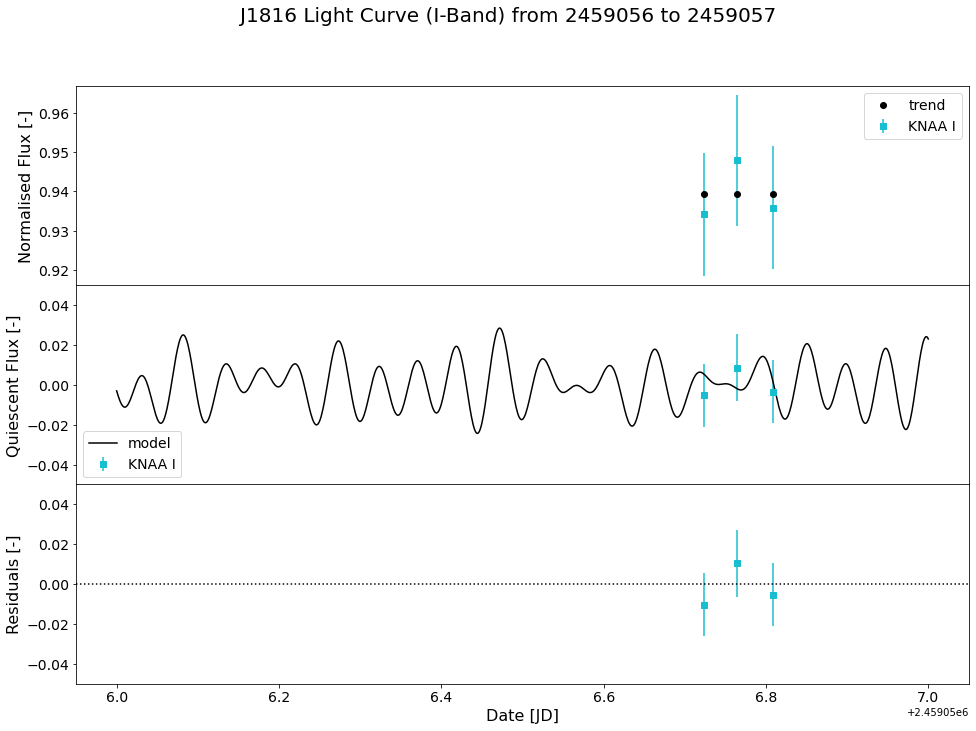

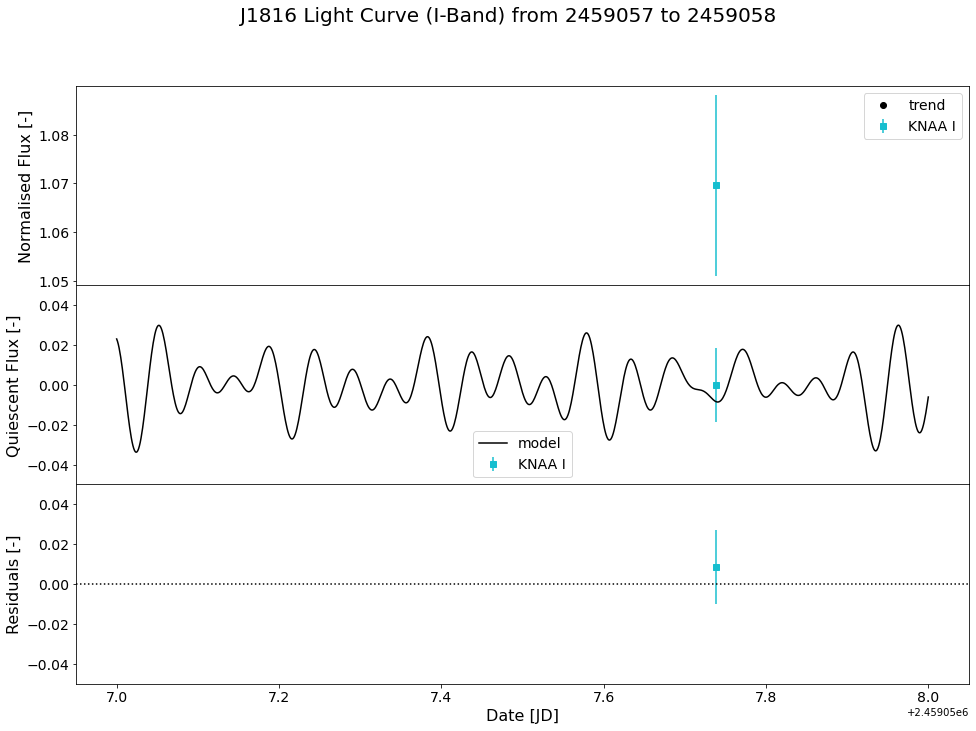

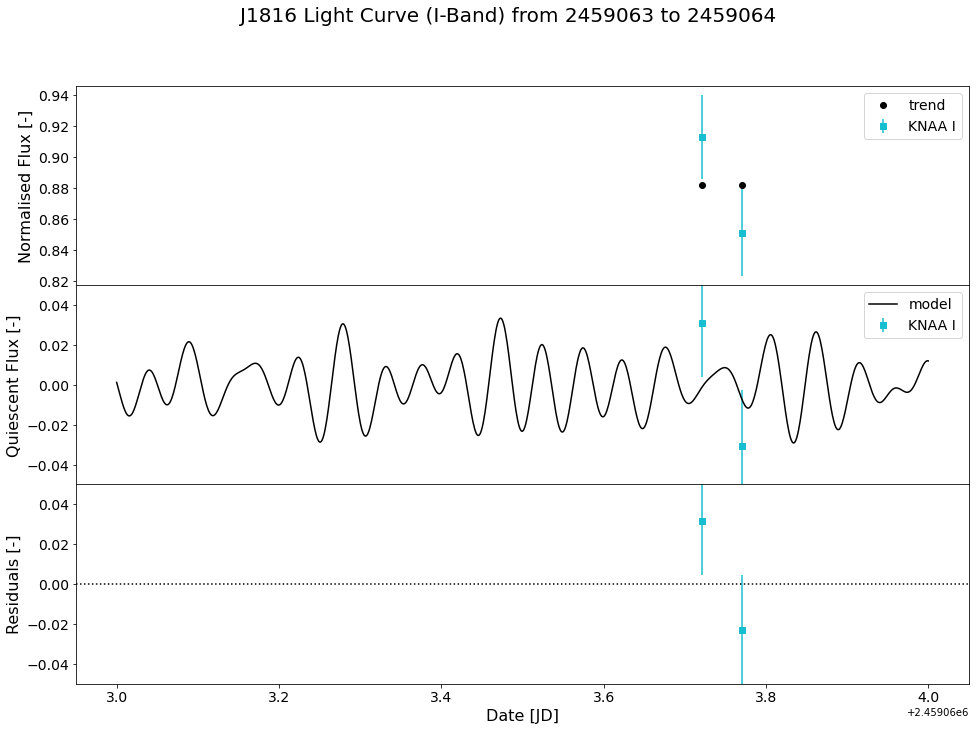

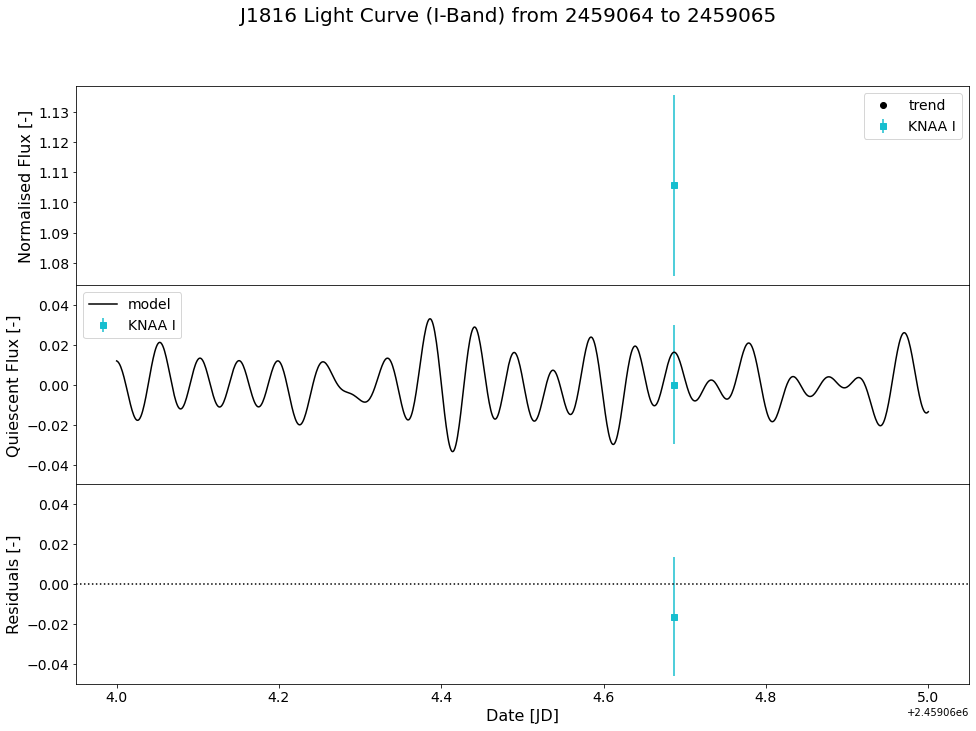

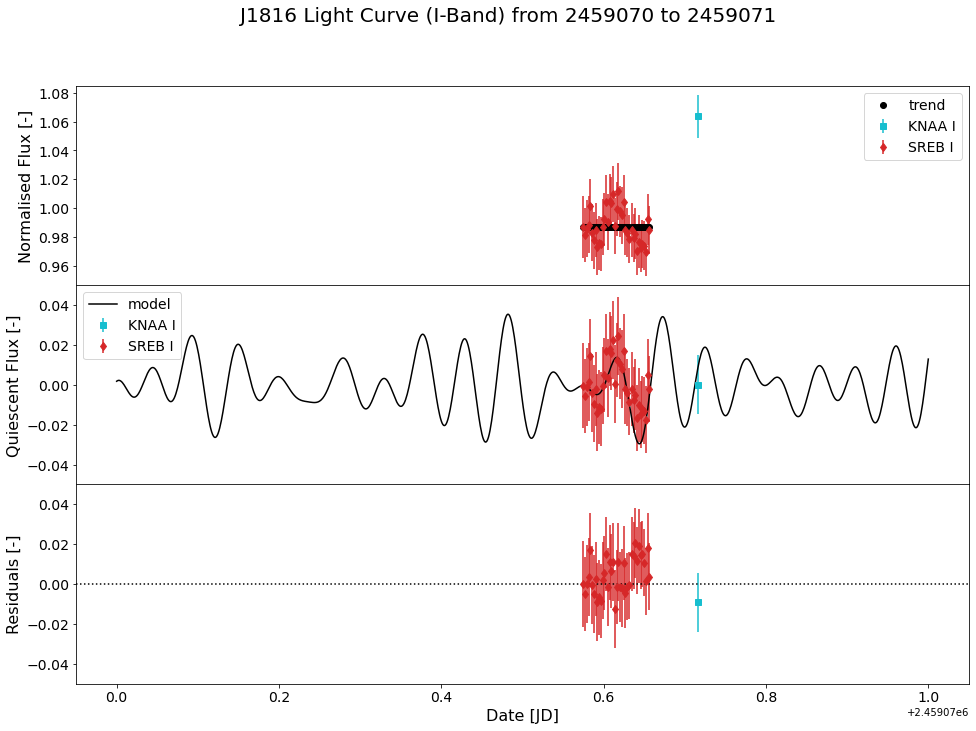

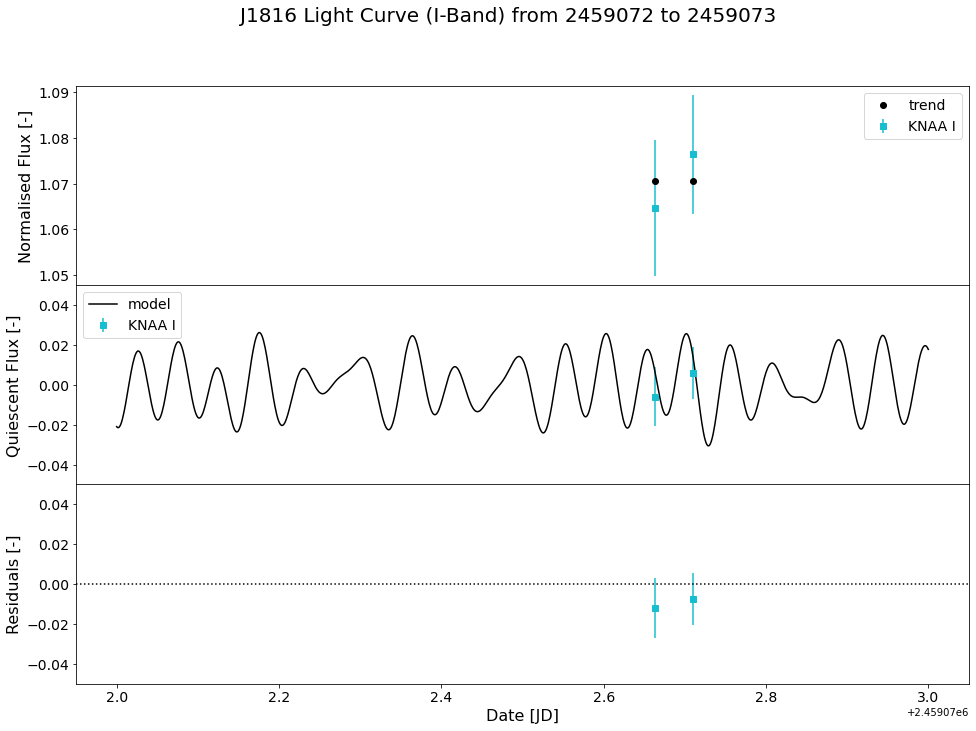

In [34]:
# determine time range
tmin = 1e10
tmax = 0
for time in itimes:
    if time[0] < tmin:
        tmin = time[0]
    if time[-1] > tmax:
        tmax = time[-1]
tmin = np.floor(tmin)
tmax = np.ceil(tmax)

dt = 1
print('there is data between %i and %i, which is %i days' % (tmin, tmax, tmax-tmin))

while tmin < tmax:
    label = 'trend'
    alpha = 1
    tot = 0
    fig = plt.figure(figsize=(16, 11))
    fig.suptitle('J1816 Light Curve (I-Band) from %i to %i' % (tmin, tmin + dt), fontsize=20)
    ax0 = plt.subplot2grid((3, 1), (0, 0), rowspan=1, colspan=1)
    ax0.set_ylabel('Normalised Flux [-]', fontsize=16)
    ax0.tick_params(labelsize=14)
    ax1 = plt.subplot2grid((3, 1), (1, 0), rowspan=1, colspan=1, sharex=ax0)
    ax1.set_ylabel('Quiescent Flux [-]', fontsize=16)
    ax1.tick_params(labelsize=14)
    ax2 = plt.subplot2grid((3, 1), (2, 0), rowspan=1, colspan=1, sharex=ax0)
    ax2.set_ylabel('Residuals [-]', fontsize=16)
    ax2.set_xlabel('Date [JD]', fontsize=16)
    ax2.tick_params(labelsize=14)
    zip_params = (itimes, ifluxes, ifluxes_smooth, ifluxes_sv, ierrors, itels, isymbols, icolors)
    for itime, iflux, iflux_smooth, iflux_sv, ierror, itel, isymbol, icolor in zip(*zip_params):
        mask = (itime >= tmin) * (itime <= tmin + dt)
        if np.sum(mask) > 0:
            tot += np.sum(mask)
            # top plot
            ax0.errorbar(itime[mask], iflux[mask], yerr=ierror[mask], fmt=isymbol, 
                         color=icolor, label=itel, alpha=alpha)
            ax0.plot(itime[mask], iflux_smooth[mask], 'ko', lw=4, label=label)
            # middle plot
            ax1.errorbar(itime[mask], iflux_sv[mask], yerr=ierror[mask], fmt=isymbol, 
                         color=icolor, label=itel, alpha=alpha)
            # bottom plot
            model_flux = sv_model(best_fit, itime[mask])
            ax2.errorbar(itime[mask], iflux_sv[mask] - model_flux, yerr=ierror[mask], fmt=isymbol,
                        color=icolor, label=itel, alpha=alpha)
            label=None
    # extra lines
    model_time = np.linspace(tmin, tmin + dt, 1001)
    model_flux = sv_model(best_fit, model_time)
    ax1.plot(model_time, model_flux, 'k-', label='model')
    ax2.axhline(y=0, color='k', ls=':')
    # set ylims
    ax1.set_ylim(-0.05, 0.05)
    ax2.set_ylim(-0.05, 0.05)
    if tot > 0:
        # legends
        ax0.legend(fontsize=14)
        ax1.legend(fontsize=14)
        fig.subplots_adjust(hspace=0)
        plt.savefig('plots/stellar_variation/iband/%i_%i.png' % (tmin, tmin+dt))
        plt.show()
    plt.close()
    tmin += dt


From these plots it is not so clear that <strong>KNAA</strong> and <strong>SREB</strong> follow the stellar variation model. Both <strong>KNAA</strong> has only one night of high cadence data, which follows the model reasonably well and <strong>SREB</strong> shows one night that follows reasonably well, and one night that does not at all. If we assume this is a bad night, then we could say that <strong>SREB</strong> follows the data as well.

### CV Band (No Filter)

In $CV$ band we can look at how well the model fits the data from <strong>DJUA</strong>.

In [35]:
# cv band indices
CV_inds = [4]

# get data and extract
cvband_data = get_multiple(times, fluxes, errors, telescopes, shifts, symbols, CV_inds, bin_size=bs)
cvtimes, cvfluxes, cverrors, cvtels, cvsymbols, cvcolors, cvpfits, cvtls = cvband_data


extracting DJUA CV


We smooth the data to extract and remove the trend leaving the quiescent light curve.

In [36]:
# find the trend in the data and remove it
cvfluxes_smooth = smooth_time_window(cvtimes, cvfluxes, 0.4)

# get trend-free data
cvfluxes_sv = []
for cvflux, cvflux_smooth in zip(cvfluxes, cvfluxes_smooth):
    cvfluxes_sv.append(cvflux - cvflux_smooth)

We plot the data to see how well it fits.

there is data between 2459072 and 2459128, which is 56 days


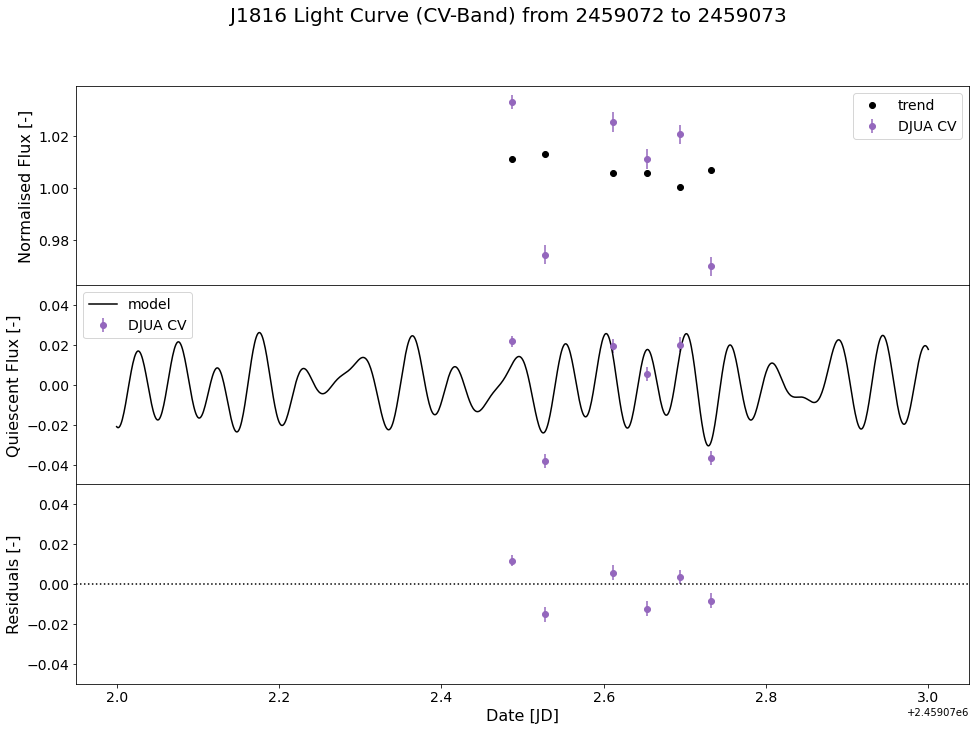

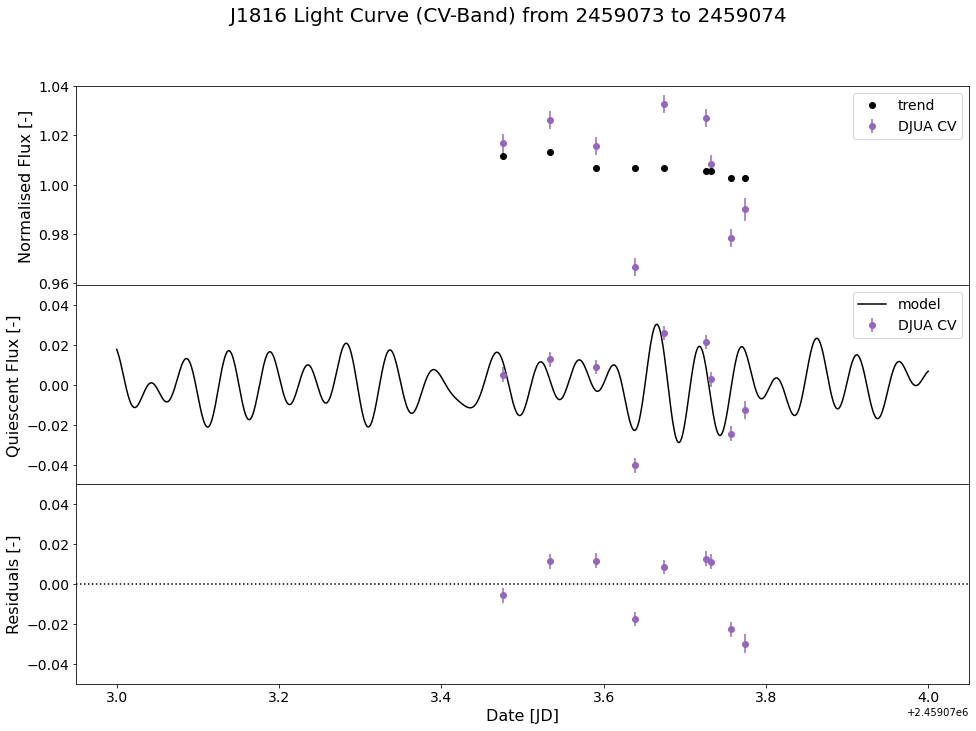

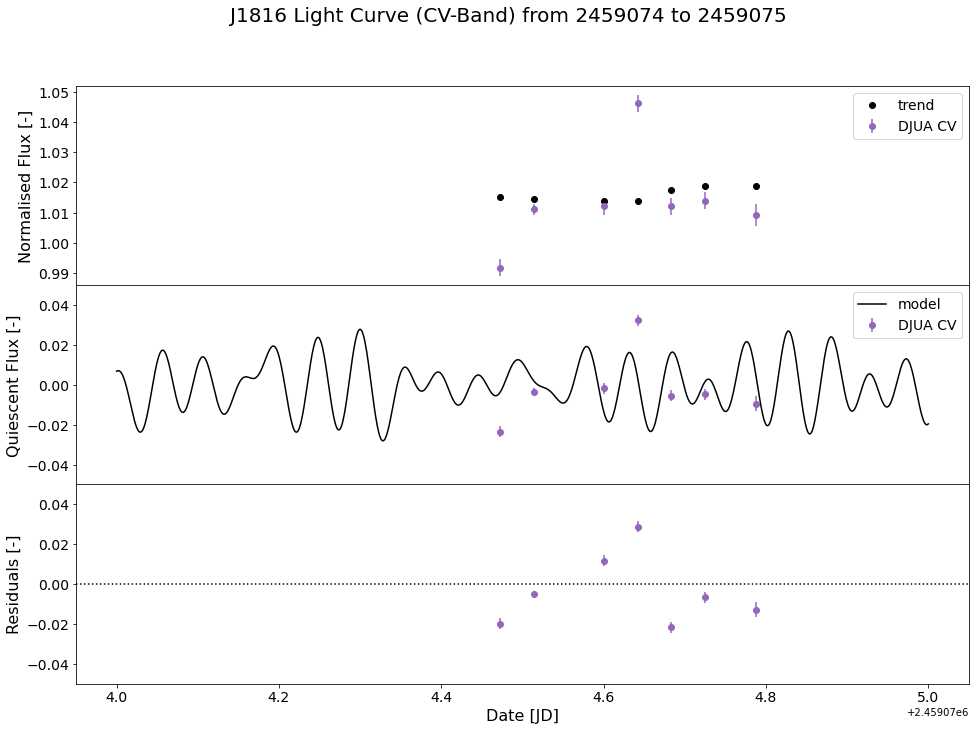

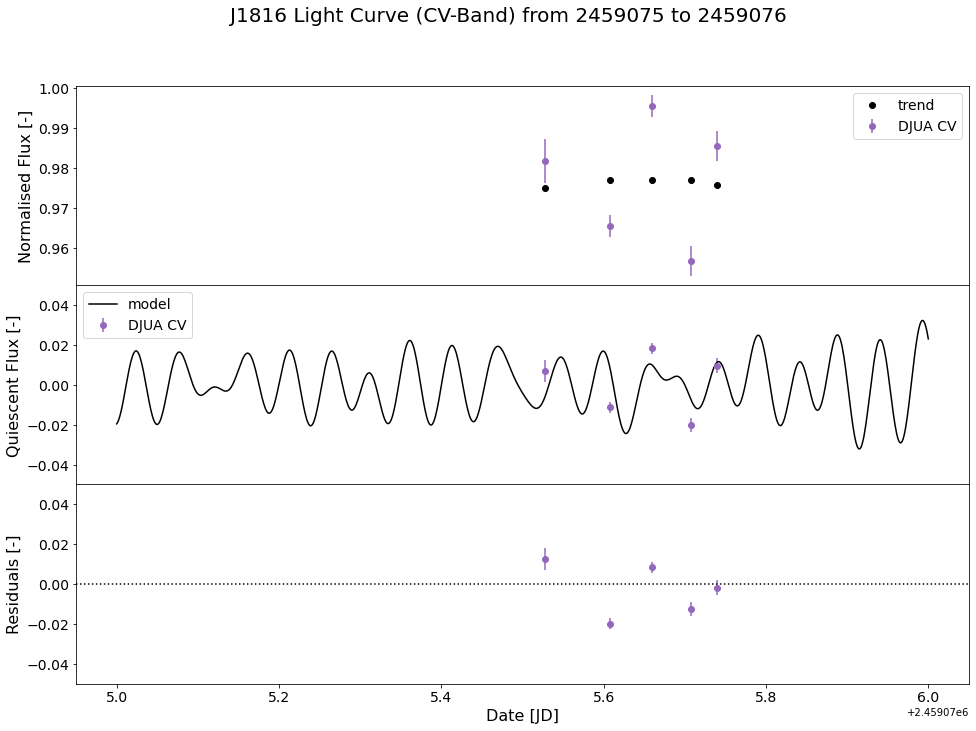

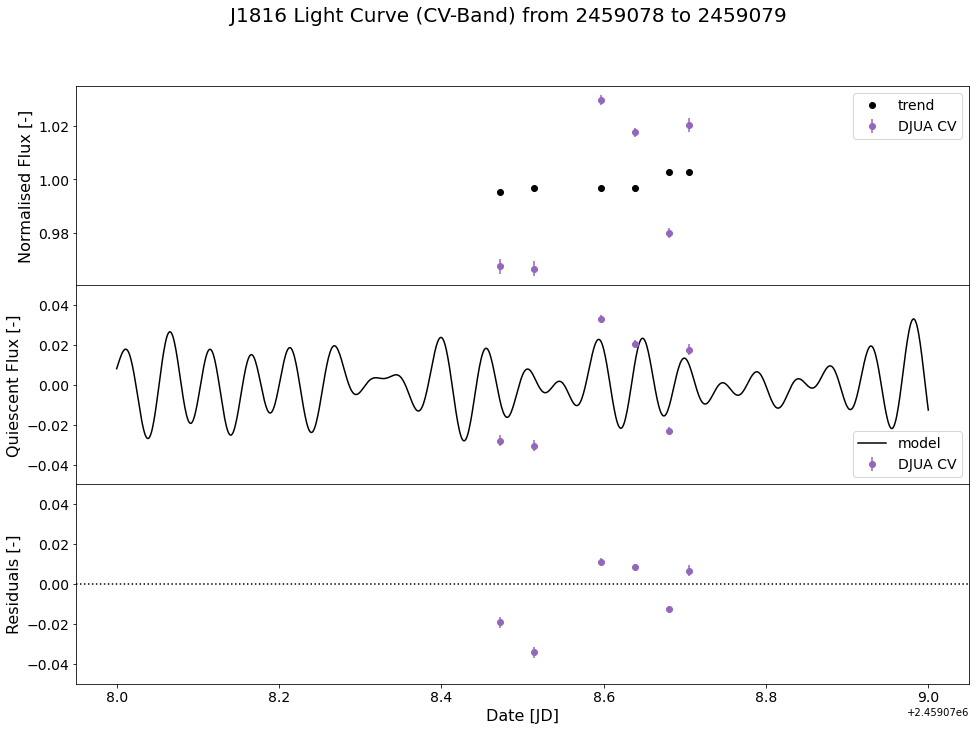

...

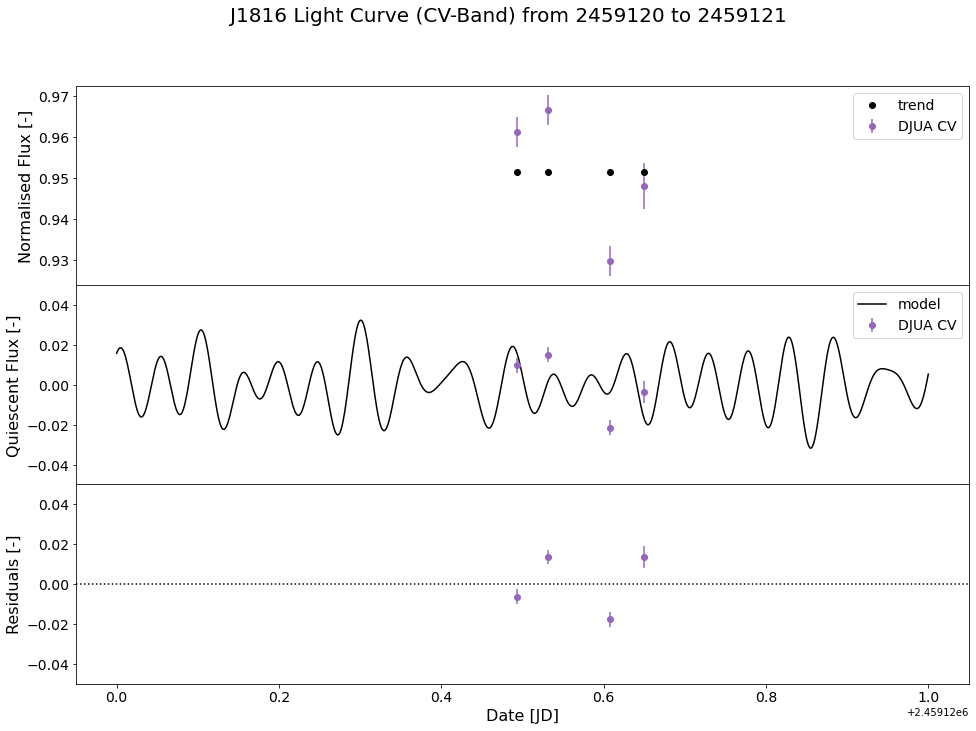

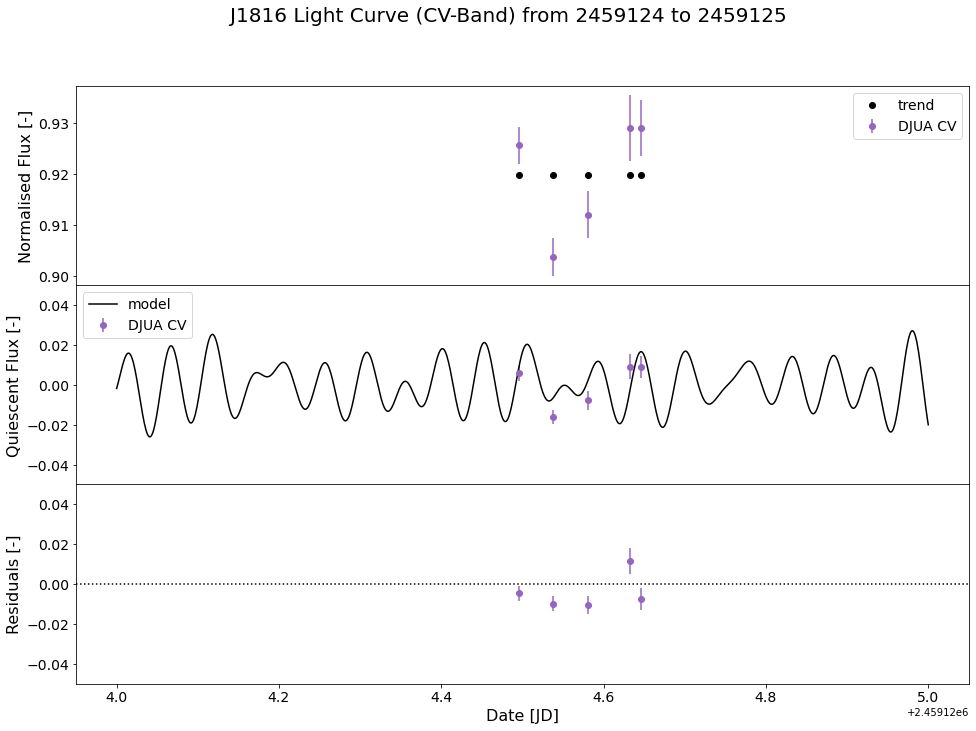

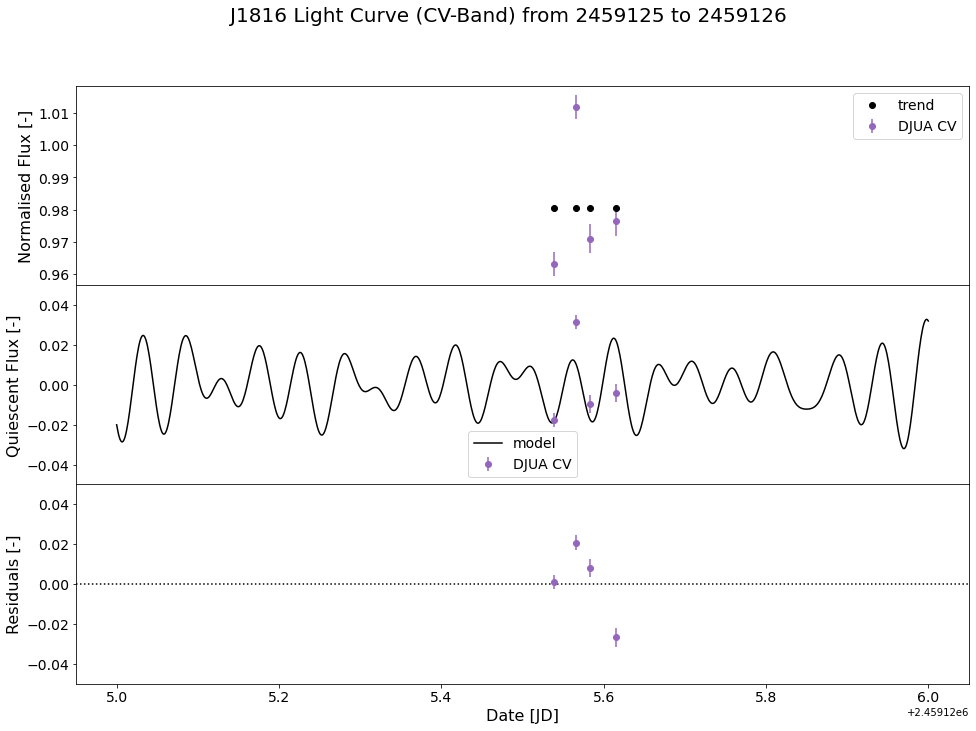

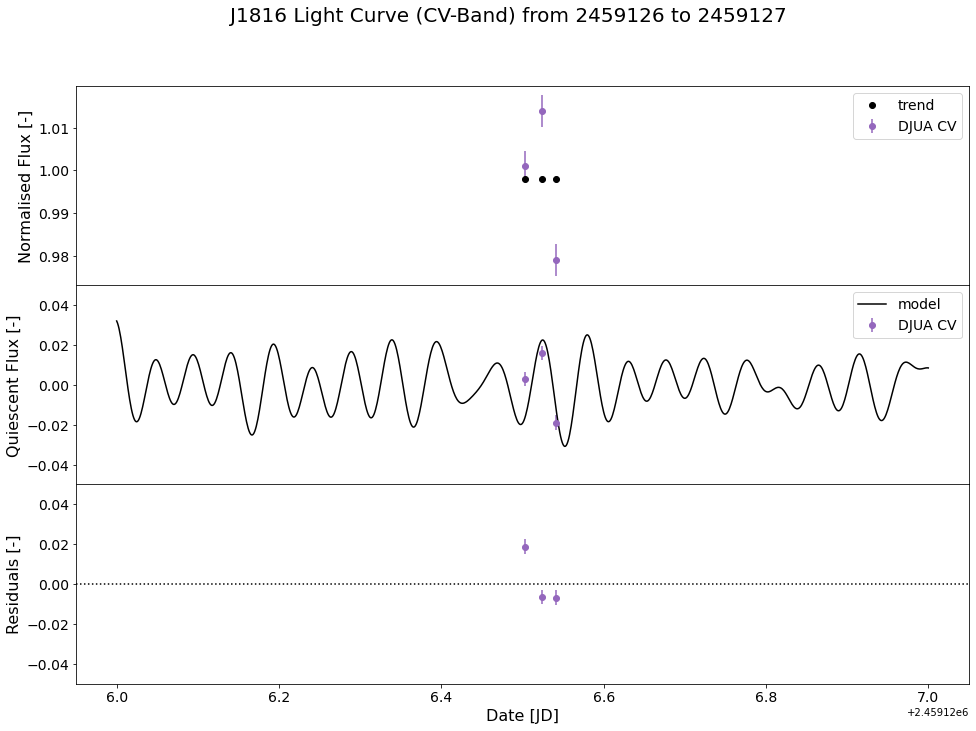

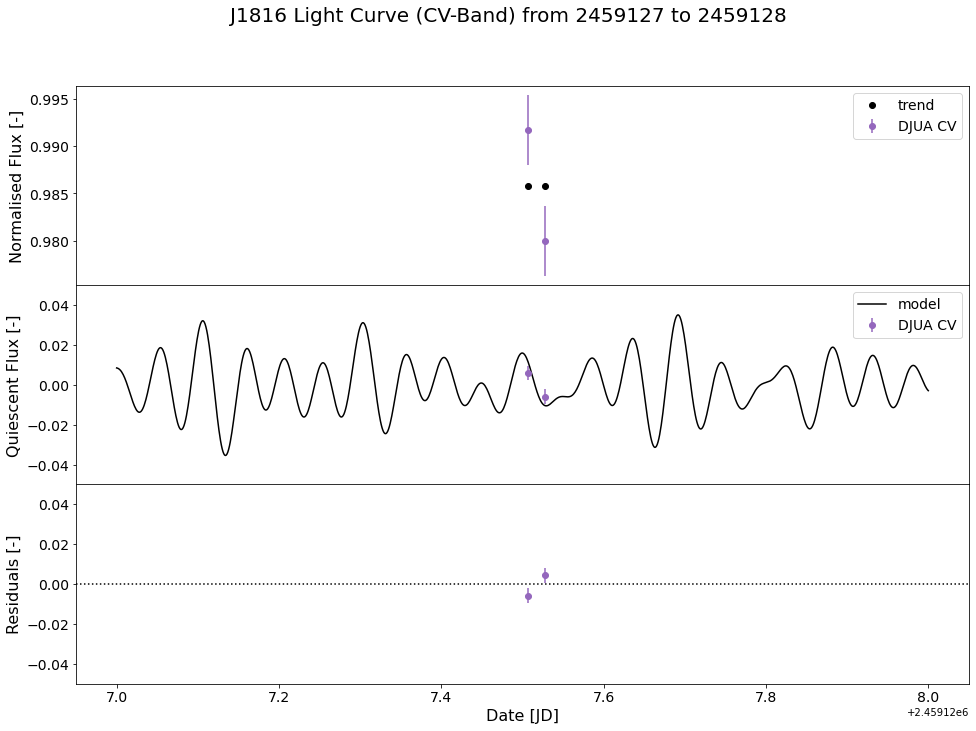

In [37]:
# determine time range
tmin = 1e10
tmax = 0
for time in cvtimes:
    if time[0] < tmin:
        tmin = time[0]
    if time[-1] > tmax:
        tmax = time[-1]
tmin = np.floor(tmin)
tmax = np.ceil(tmax)

dt = 1
print('there is data between %i and %i, which is %i days' % (tmin, tmax, tmax-tmin))

while tmin < tmax:
    label = 'trend'
    alpha = 1
    tot = 0
    fig = plt.figure(figsize=(16, 11))
    fig.suptitle('J1816 Light Curve (CV-Band) from %i to %i' % (tmin, tmin + dt), fontsize=20)
    ax0 = plt.subplot2grid((3, 1), (0, 0), rowspan=1, colspan=1)
    ax0.set_ylabel('Normalised Flux [-]', fontsize=16)
    ax0.tick_params(labelsize=14)
    ax1 = plt.subplot2grid((3, 1), (1, 0), rowspan=1, colspan=1, sharex=ax0)
    ax1.set_ylabel('Quiescent Flux [-]', fontsize=16)
    ax1.tick_params(labelsize=14)
    ax2 = plt.subplot2grid((3, 1), (2, 0), rowspan=1, colspan=1, sharex=ax0)
    ax2.set_ylabel('Residuals [-]', fontsize=16)
    ax2.set_xlabel('Date [JD]', fontsize=16)
    ax2.tick_params(labelsize=14)
    zip_params = (cvtimes, cvfluxes, cvfluxes_smooth, cvfluxes_sv, cverrors, cvtels, cvsymbols, cvcolors)
    for cvtime, cvflux, cvflux_smooth, cvflux_sv, cverror, cvtel, cvsymbol, cvcolor in zip(*zip_params):
        mask = (cvtime >= tmin) * (cvtime <= tmin + dt)
        if np.sum(mask) > 0:
            tot += np.sum(mask)
            # top plot
            ax0.errorbar(cvtime[mask], cvflux[mask], yerr=cverror[mask], fmt=cvsymbol, 
                         color=cvcolor, label=cvtel, alpha=alpha)
            ax0.plot(cvtime[mask], cvflux_smooth[mask], 'ko', lw=4, label=label)
            # middle plot
            ax1.errorbar(cvtime[mask], cvflux_sv[mask], yerr=cverror[mask], fmt=cvsymbol, 
                         color=cvcolor, label=cvtel, alpha=alpha)
            # bottom plot
            model_flux = sv_model(best_fit, cvtime[mask])
            ax2.errorbar(cvtime[mask], cvflux_sv[mask] - model_flux, yerr=cverror[mask], fmt=cvsymbol,
                        color=cvcolor, label=cvtel, alpha=alpha)
            label=None
    # extra lines
    model_time = np.linspace(tmin, tmin + dt, 1001)
    model_flux = sv_model(best_fit, model_time)
    ax1.plot(model_time, model_flux, 'k-', label='model')
    ax2.axhline(y=0, color='k', ls=':')
    # set ylims
    ax1.set_ylim(-0.05, 0.05)
    ax2.set_ylim(-0.05, 0.05)
    if tot > 0:
        # legends
        ax0.legend(fontsize=14)
        ax1.legend(fontsize=14)
        fig.subplots_adjust(hspace=0)
        plt.savefig('plots/stellar_variation/cvband/%i_%i.png' % (tmin, tmin+dt))
        plt.show()
    plt.close()
    tmin += dt


The $CV$ data from <strong>DJUA</strong> is a reasonable fit but inconclusive.

### B band

In $B$ band we can look at how well the model fits the data from <strong>OAAA</strong>, <strong>MMEA</strong> and <strong>KNAA</strong>.

In [38]:
# b band indices
B_inds = [8, 16, 19]

# get data and extract
bband_data = get_multiple(times, fluxes, errors, telescopes, shifts, symbols, B_inds, bin_size=bs)
btimes, bfluxes, berrors, btels, bsymbols, bcolors, bpfits, btls = bband_data

extracting KNAA B
extracting MMEA B
extracting OAAA B


We smooth the data to extract and remove the trend leaving the quiescent light curve.

In [39]:
# find the trend in the data and remove it
bfluxes_smooth = smooth_time_window(btimes, bfluxes, 0.4)

# get trend-free data
bfluxes_sv = []
for bflux, bflux_smooth in zip(bfluxes, bfluxes_smooth):
    bfluxes_sv.append(bflux - bflux_smooth)

We plot the data to see how well it fits.

there is data between 2459046 and 2459134, which is 88 days


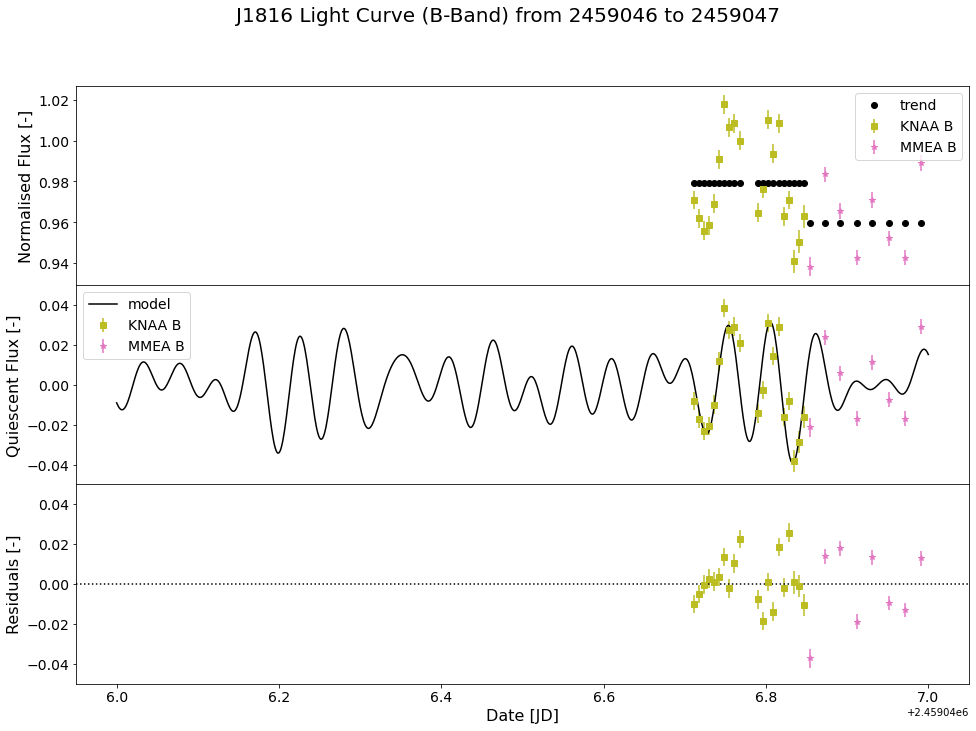

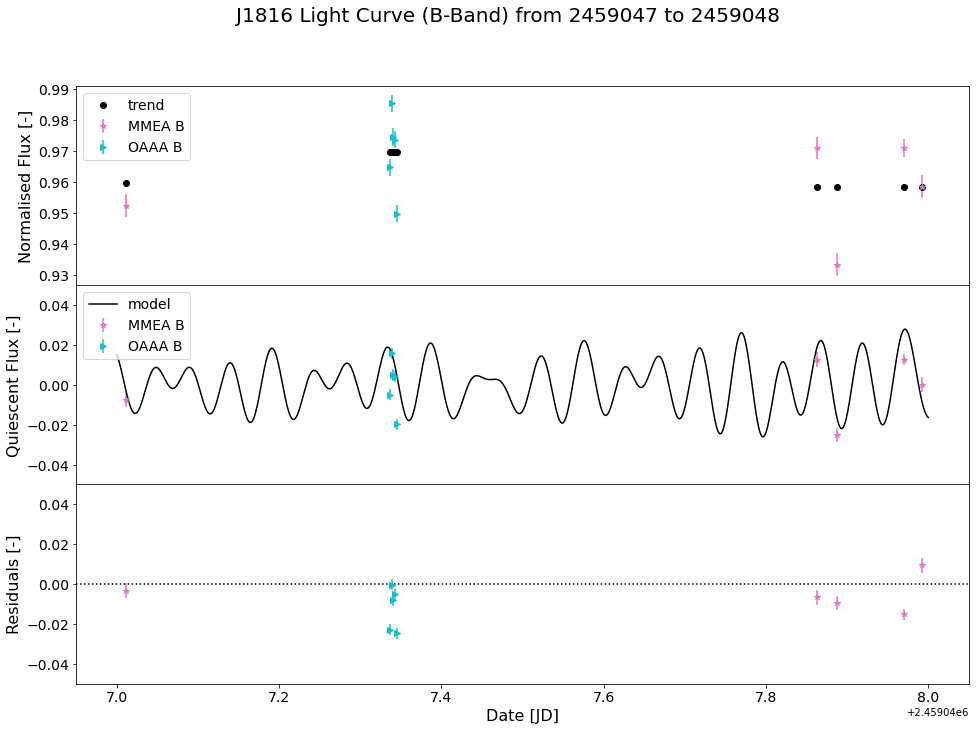

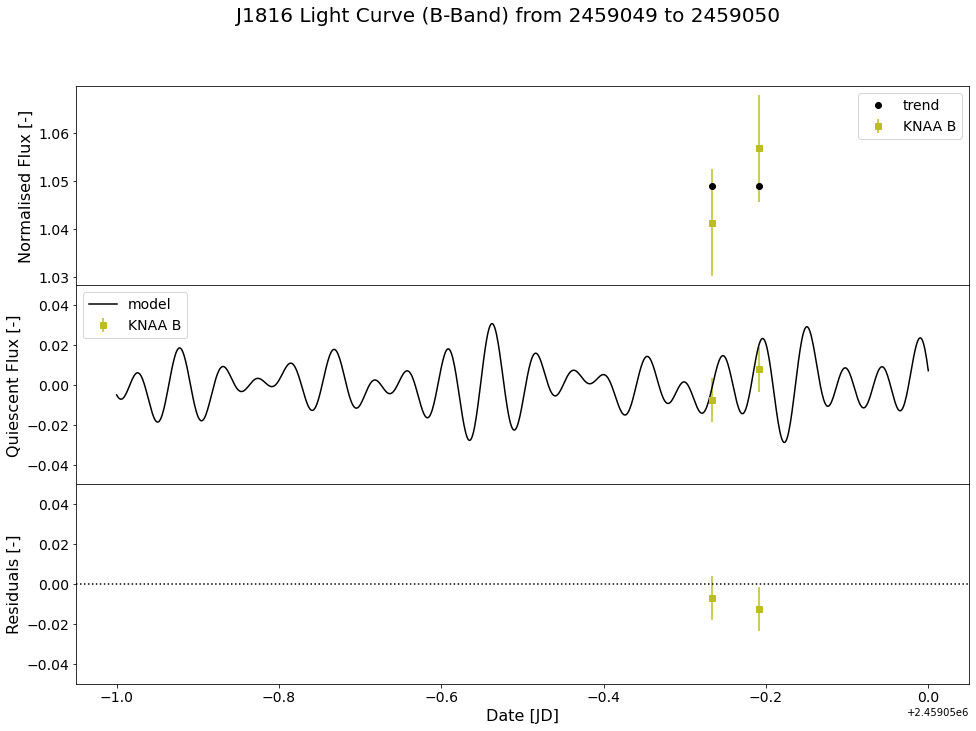

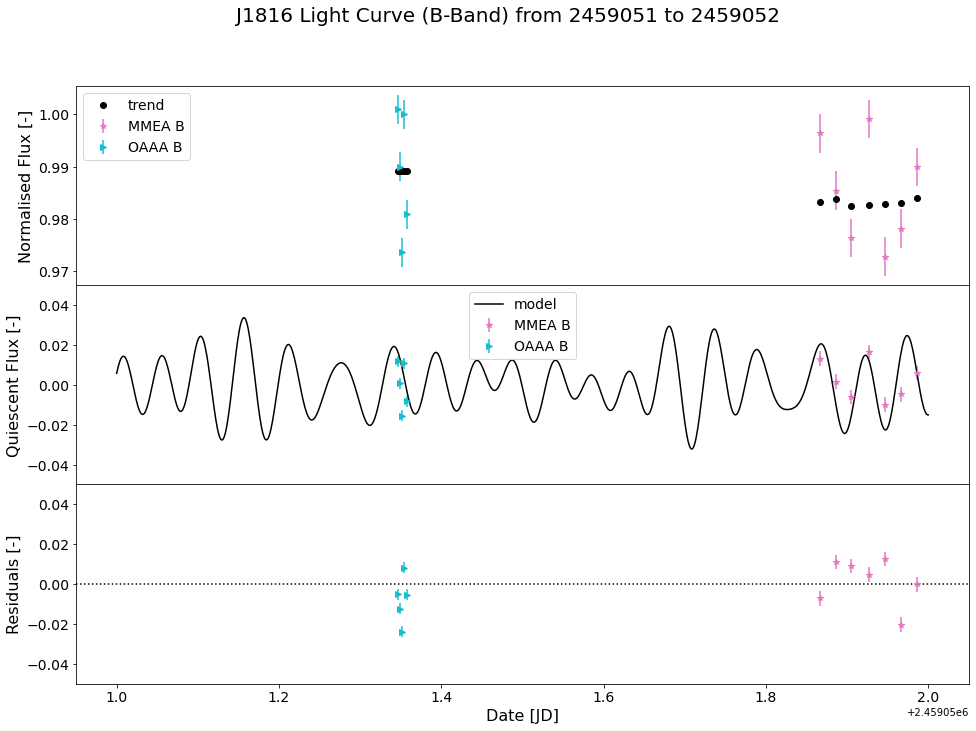

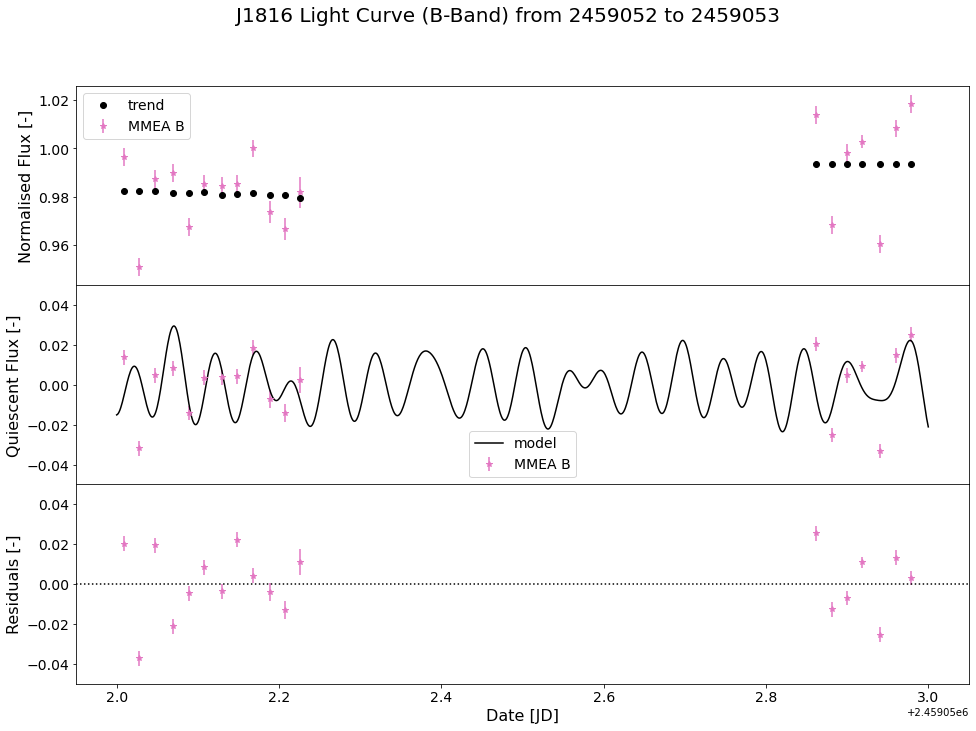

...

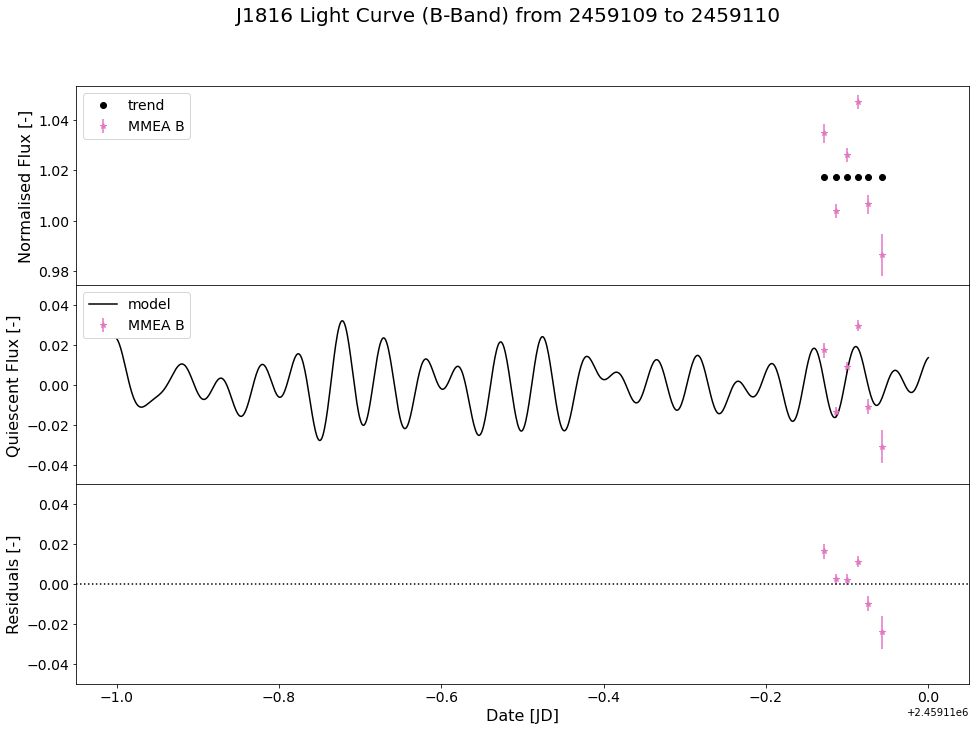

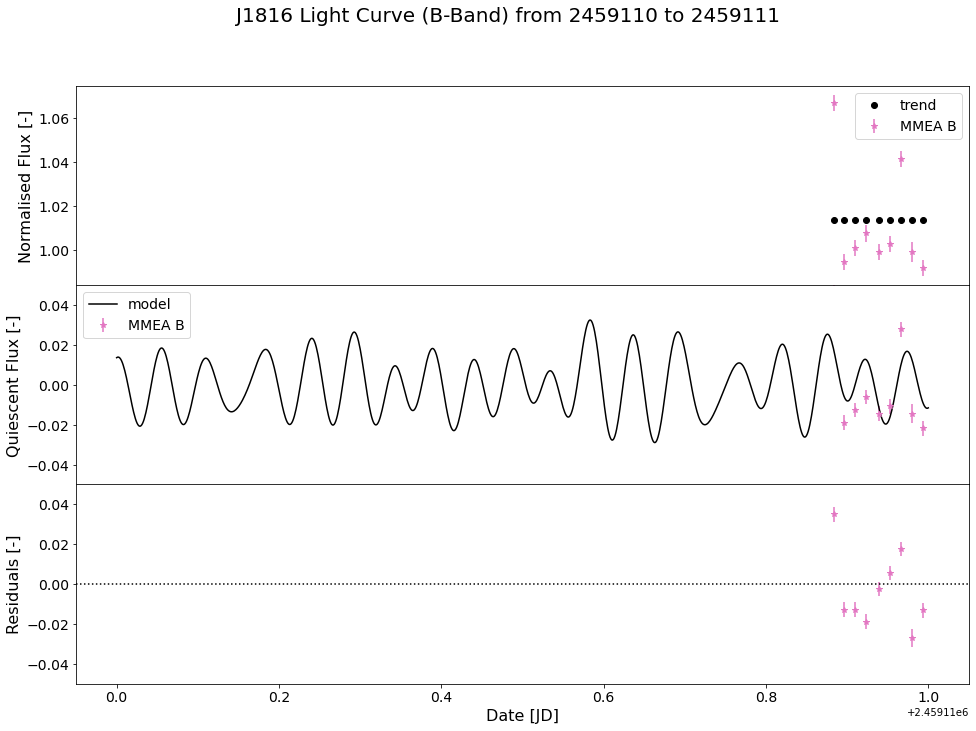

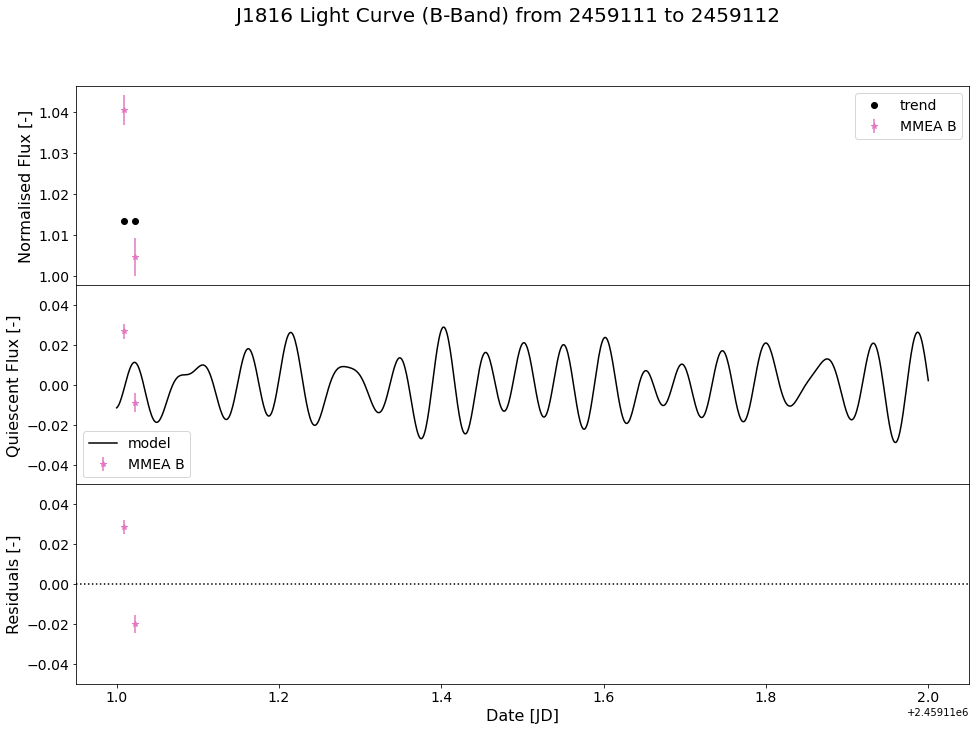

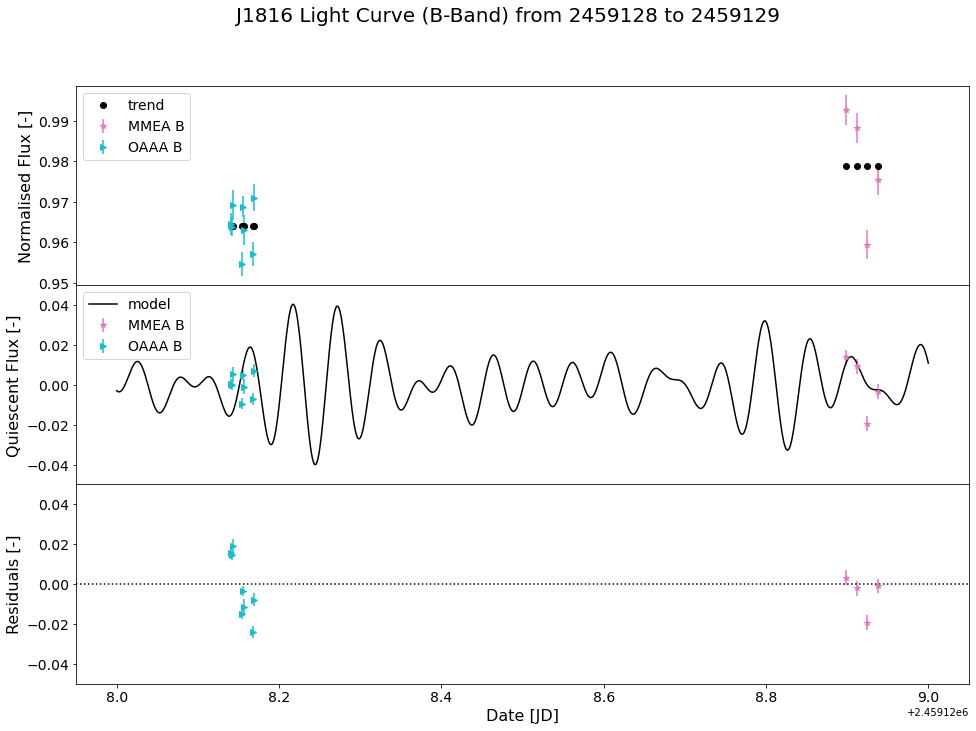

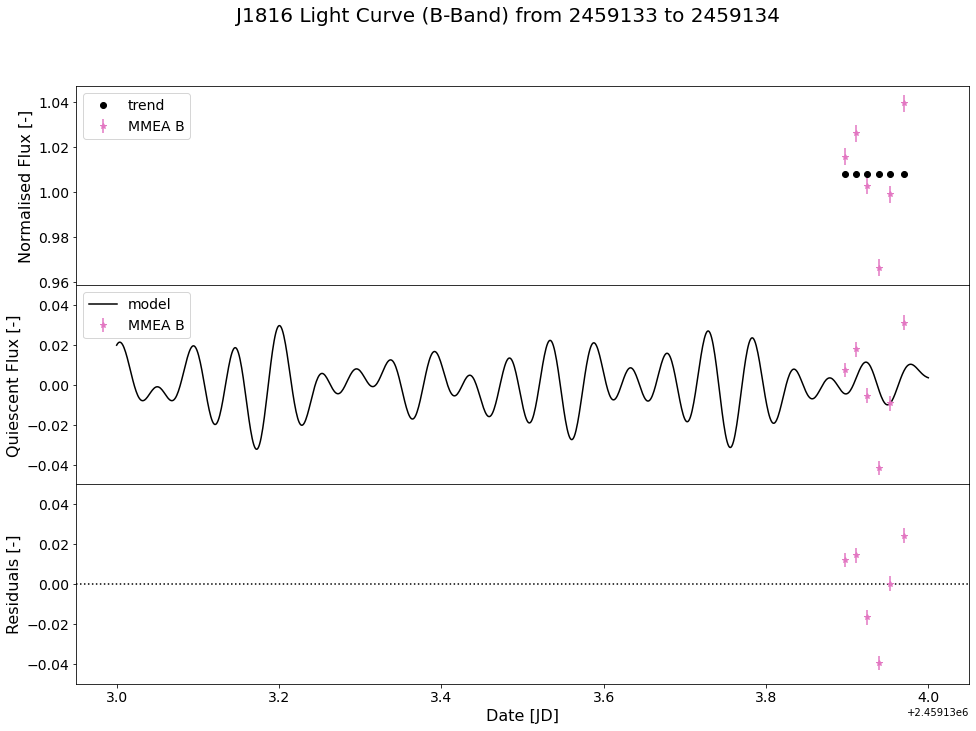

In [40]:
# determine time range
tmin = 1e10
tmax = 0
for time in btimes:
    if time[0] < tmin:
        tmin = time[0]
    if time[-1] > tmax:
        tmax = time[-1]
tmin = np.floor(tmin)
tmax = np.ceil(tmax)

dt = 1
print('there is data between %i and %i, which is %i days' % (tmin, tmax, tmax-tmin))

while tmin < tmax:
    label = 'trend'
    alpha = 1
    tot = 0
    fig = plt.figure(figsize=(16, 11))
    fig.suptitle('J1816 Light Curve (B-Band) from %i to %i' % (tmin, tmin + dt), fontsize=20)
    ax0 = plt.subplot2grid((3, 1), (0, 0), rowspan=1, colspan=1)
    ax0.set_ylabel('Normalised Flux [-]', fontsize=16)
    ax0.tick_params(labelsize=14)
    ax1 = plt.subplot2grid((3, 1), (1, 0), rowspan=1, colspan=1, sharex=ax0)
    ax1.set_ylabel('Quiescent Flux [-]', fontsize=16)
    ax1.tick_params(labelsize=14)
    ax2 = plt.subplot2grid((3, 1), (2, 0), rowspan=1, colspan=1, sharex=ax0)
    ax2.set_ylabel('Residuals [-]', fontsize=16)
    ax2.set_xlabel('Date [JD]', fontsize=16)
    ax2.tick_params(labelsize=14)
    zip_params = (btimes, bfluxes, bfluxes_smooth, bfluxes_sv, berrors, btels, bsymbols, bcolors)
    for btime, bflux, bflux_smooth, bflux_sv, berror, btel, bsymbol, bcolor in zip(*zip_params):
        mask = (btime >= tmin) * (btime <= tmin + dt)
        if np.sum(mask) > 0:
            tot += np.sum(mask)
            # top plot
            ax0.errorbar(btime[mask], bflux[mask], yerr=berror[mask], fmt=bsymbol, 
                         color=bcolor, label=btel, alpha=alpha)
            ax0.plot(btime[mask], bflux_smooth[mask], 'ko', lw=4, label=label)
            # middle plot
            ax1.errorbar(btime[mask], bflux_sv[mask], yerr=berror[mask], fmt=bsymbol, 
                         color=bcolor, label=btel, alpha=alpha)
            # bottom plot
            model_flux = sv_model(best_fit, btime[mask])
            ax2.errorbar(btime[mask], bflux_sv[mask] - model_flux, yerr=berror[mask], fmt=bsymbol,
                        color=bcolor, label=btel, alpha=alpha)
            label=None
    # extra lines
    model_time = np.linspace(tmin, tmin + dt, 1001)
    model_flux = sv_model(best_fit, model_time)
    ax1.plot(model_time, model_flux, 'k-', label='model')
    ax2.axhline(y=0, color='k', ls=':')
    # set ylims
    ax1.set_ylim(-0.05, 0.05)
    ax2.set_ylim(-0.05, 0.05)
    if tot > 0:
        # legends
        ax0.legend(fontsize=14)
        ax1.legend(fontsize=14)
        fig.subplots_adjust(hspace=0)
        plt.savefig('plots/stellar_variation/bband/%i_%i.png' % (tmin, tmin+dt))
        plt.show()
    plt.close()
    tmin += dt

From these plots it is quite clear that <strong>OAAA</strong>, <strong>MMEA</strong>, and <strong>KNAA</strong> all seem to follow the stellar variation model to a reasonable degree. The change in amplitude is debatable (can be explored).

# Summary

We can conclude from this notebook that a 10 sinusoid model fitted on just the <strong>DGRA</strong> data produces a relatively good fit of the stellar variations observed. This was checked in all filters observed and the variations are clearly visible. $B$ band could possibly show a colour dependency of the variations, but this needs to be checked. We present and save the best fit parameter of the model below.

In [41]:
np.save('models/best_fits/stellar_variations.npy', best_fit)